# Shakespeare & Company Analysis

---

## Historical Context

[Shakespeare and Company Project](https://shakespeareandco.princeton.edu/)

In 1919, Sylvia Beach (1887–1962), an American expatriate, established an English-language bookshop and lending library on the Left Bank in Paris. Named Shakespeare and Company, it became a vibrant hub of expatriate literary and intellectual life. In 1922, Beach gained international fame by publishing James Joyce’s *Ulysses* under the Shakespeare and Company imprint.

For over two decades, the bookshop and lending library offered a diverse collection ranging from avant-garde poetry to philosophy and even birth control manuals. Despite its cultural significance, the bookshop closed in 1941 during the German occupation of France. Although Shakespeare and Company never reopened, Beach continued to loan books from her apartment until her passing in 1962.

The Shakespeare and Company Project leverages Beach’s meticulously kept records to illuminate the reading practices of prominent 20th-century writers and countless other artists, intellectuals, and students who lived in Paris during the interwar years.

---

## Thesis

This Master's thesis addresses the following research question:

**What patterns of literary influence and social connectivity emerge from the borrowing activity among author-members of the Shakespeare and Company lending library in the early 20th century?**

### Definition of Author-Members
Author-members are defined as individuals who had at least one book, authored solely by them, available in the Shakespeare and Company lending library.

---

## Notebook Overview

This notebook includes the following analyses:

### 1. Author-Member Intersections
- Identification of shared characteristics among author-members.

### 2. Geographical Analysis
- **By Continent:** Distribution of author-members across continents.
- **In and Around Paris:** Locations of author-members within Paris and its surroundings.
- **Shared Addresses:** Exploration of shared addresses to identify potential connections.

### 3. Statistical Analysis
- **Nationalities:** Examination of author-member national origins.
- **Gender:** Analysis of the gender distribution among author-members.
- **Birth Years:** Investigation of generational patterns based on birth years.

### 4. Book Contributions
- Quantification of books authored by author-members available in the library.

### 5. Network Analysis of Borrowing Activity
- **All Books:** Borrowing activity across the entire collection, with network metrics calculated.
- **Author-Member Books:** Focused analysis of borrowing activity involving books authored by author-members, with corresponding network metrics.

This notebook serves as a tool to explore and visualize the complex social and literary networks that characterized Shakespeare and Company in the early 20th century.

In [1]:
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import seaborn as sns
import pandas as pd
from matplotlib_venn import venn2
from scipy.stats import entropy
import numpy as np
from pyproj import Transformer
import networkx as nx
import geopandas as gpd
import contextily as ctx
from shapely.geometry import box

In [2]:
books = pd.read_csv('../data/SCoData_books_v1.2_2022_01.csv', encoding='utf-8', dtype={'year': 'Int32'})
members = pd.read_csv('../data/SCoData_members_v1.2_2022_01.csv', encoding='utf-8')
events = pd.read_csv('../data/SCoData_events_v1.2_2022_01.csv', encoding='utf-8', low_memory=False)

In [3]:
books.columns

Index(['uri', 'title', 'author', 'editor', 'translator', 'introduction',
       'illustrator', 'photographer', 'year', 'format', 'uncertain',
       'ebook_url', 'volumes_issues', 'notes', 'event_count', 'borrow_count',
       'purchase_count', 'circulation_years', 'updated'],
      dtype='object')

## Authors

In the next steps, the authors will be identified.

In [4]:
# Filter books of format 'Book', select relevant columns, and split authors into lists
book_authors = (
    books[books['format'] == 'Book'][['author']]  # Filter only books, selecting 'author' column
    .dropna(subset=['author'])  # Drop rows with missing authors specifically
    .assign(author=lambda df: df['author'].str.split(';'))  # Split authors into lists if multiple authors are separated by ';'
)

# Exploding the 'author' column to create a new row for each author per book
exploded_authors = book_authors.explode('author')

# Remove duplicates to get only unique authors
unique_authors = exploded_authors.drop_duplicates(subset=['author'])

# Display a sample of the resulting DataFrame to verify the result
unique_authors.sample(10)
unique_authors.shape

(2084, 1)

## Members

In the next step, the members will be identified.

In [5]:
# Filter members and remove duplicates in one step
member_filtered = members[['sort_name']].dropna().drop_duplicates(subset=['sort_name'])

# Verify the shape of the filtered and deduplicated data
member_filtered.shape

# unique_members is now simply the same as member_filtered
unique_members = member_filtered

# Verify the shape of the unique members
unique_members.shape

(4804, 1)

## Intersection: Authors and Members

Now the intersection between authors and members will be identified to extract the authors who were also members of the Shakespeare and Company lending library.

In [6]:
# Extract unique authors and members
unique_authors = set(books['author'])
unique_members = set(members['sort_name'])

# Calculate the intersection
intersection_names = unique_authors.intersection(unique_members)

# Create a DataFrame from the intersection
intersection_df = pd.DataFrame({'name': list(intersection_names)})

# Merge to get all columns for matched members
member_is_author = members[members['sort_name'].isin(intersection_df['name'])]

# Display shapes for debugging/verification
print(f"Intersection count: {len(intersection_names)}")
print(f"Matched members shape: {member_is_author.shape}")

Intersection count: 84
Matched members shape: (84, 19)


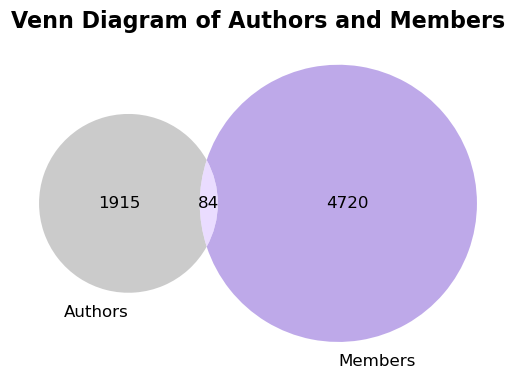

In [7]:
# Create the Venn diagram for authors with customized colors and modern style
venn = venn2(subsets=(len(unique_authors) - len(intersection_names), 
                     len(unique_members) - len(intersection_names), 
                     len(intersection_names)),
             set_labels=('Authors', 'Members'),
             set_colors=('darkgray', 'mediumpurple'),
             alpha=0.6)

# Customize the subset labels
for subset in venn.subset_labels:
    if subset is not None:
        subset.set_fontsize(12)
        subset.set_color('black')

# Display the plot
plt.title("Venn Diagram of Authors and Members", fontsize=16, fontweight='bold')
plt.show()

In [8]:
# Calculate the size of the intersection set
intersection_size = len(intersection_names)

# Calculate the percentages
percent_intersection_authors = (intersection_size / len(unique_authors)) * 100
percent_intersection_members = (intersection_size / len(unique_members)) * 100

# Print the results
print(f'Percent of the intersection relative to authors: {percent_intersection_authors:.2f}%')
print(f'Percent of the intersection relative to members: {percent_intersection_members:.2f}%')

Percent of the intersection relative to authors: 4.20%
Percent of the intersection relative to members: 1.75%


## Geographical Analysis

Next, the geographical analysis will be performed to identify the locations of the author-members and find geospatial patterns.

In [9]:
# Split the coordinates and create a new DataFrame
coordinate_list = member_is_author['coordinates'].str.split(';').explode()
address_list = member_is_author['addresses'].str.split(';').explode()

# Create a DataFrame for coordinates
coordinates_df = coordinate_list.str.split(',', expand=True).apply(lambda x: x.str.strip())
coordinates_df.columns = ['latitude', 'longitude']

# Handle invalid values by replacing them with NaN
coordinates_df['latitude'] = pd.to_numeric(coordinates_df['latitude'], errors='coerce')
coordinates_df['longitude'] = pd.to_numeric(coordinates_df['longitude'], errors='coerce')

# Add the sort_name and addresses column to the coordinates DataFrame
coordinates_df['sort_name'] = member_is_author['sort_name'].repeat(coordinate_list.groupby(level=0).size()).values
coordinates_df['address'] = address_list.values

# Display the resulting DataFrame
print(coordinates_df)

      latitude  longitude              sort_name  \
45    48.84835    2.34269     Aldington, Richard   
83    48.85908    2.32429  Anderson, Margaret C.   
94    48.85092    2.33845        Antheil, George   
101   48.88241    2.27120          Aragon, Louis   
122   48.83907    2.33162           Asch, Nathan   
...        ...        ...                    ...   
5057  48.84151    2.34177       Wilder, Thornton   
5057  48.85459    2.33696       Wilder, Thornton   
5098  48.85527    2.32557       Wilson, Margaret   
5109  48.85074    2.33427          Wilson, Romer   
5180  48.88504    2.26120        Wright, Richard   

                                               address  
45         Select Hôtel, 1 place de la Sorbonne, Paris  
83                       80 rue de l'Université, Paris  
94                            12 rue de l'Odéon, Paris  
101             12 rue Saint-Pierre, Neuilly-sur-Seine  
122      Hôtel Istria, 29 rue Campagne Première, Paris  
...                              

In [10]:
def ensure_crs(gdf, crs_in="EPSG:4326", crs_out=None):
    """
    Ensures that the GeoDataFrame has a Coordinate Reference System (CRS) set.

    Parameters:
    gdf (GeoDataFrame): The GeoDataFrame to ensure CRS for.
    crs_in (str, optional): The CRS to set if the GeoDataFrame does not have one. Defaults to "EPSG:4326".
    crs_out (str, optional): The CRS to transform the GeoDataFrame to. If None, no transformation is applied. Defaults to None.

    Returns:
    GeoDataFrame: The GeoDataFrame with the ensured and/or transformed CRS.
    """
    if gdf.crs is None:
        gdf.set_crs(crs_in, inplace=True)
    if crs_out:
        gdf = gdf.to_crs(crs_out)
    return gdf

def create_geodataframe(df, lon_col='longitude', lat_col='latitude', crs_in="EPSG:4326", crs_out="EPSG:3857"):
    """
    Converts a DataFrame with longitude and latitude columns into a GeoDataFrame with specified coordinate reference systems.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing longitude and latitude columns.
    lon_col (str): The name of the column containing longitude values. Default is 'longitude'.
    lat_col (str): The name of the column containing latitude values. Default is 'latitude'.
    crs_in (str): The coordinate reference system of the input data. Default is "EPSG:4326".
    crs_out (str): The coordinate reference system to convert the GeoDataFrame to. Default is "EPSG:3857".

    Returns:
    gpd.GeoDataFrame: A GeoDataFrame with the specified output coordinate reference system.
    """
    gdf = gpd.GeoDataFrame(
        df,
        geometry=gpd.points_from_xy(df[lon_col], df[lat_col]),
        crs=crs_in
    )
    return gdf.to_crs(crs_out)

def plot_map(gdf, world_map, bounds, title='Map', zoom=14, name_col=None):
    
    """ Plots a map with the given GeoDataFrame and world map.

    Parameters:
    gdf (GeoDataFrame): GeoDataFrame containing the points to plot.
    world_map (GeoDataFrame): GeoDataFrame containing the world map for background.
    bounds (tuple): Tuple containing the bounds of the map (minx, miny, maxx, maxy).
    title (str, optional): Title of the map. Default is 'Map'.
    zoom (int, optional): Zoom level for the basemap. Default is 14.
    name_col (str, optional): Column name in gdf to use for coloring points by unique values. Default is None.

    Returns:
    None """
   
    minx, miny, maxx, maxy = bounds
    # Create a color palette if name_col is provided
    if name_col:
        unique_names = gdf[name_col].unique()
        palette = sns.color_palette("Set1", len(unique_names))
        name_to_color = {name: color for name, color in zip(unique_names, palette)}
    # Plotting
    fig, ax = plt.subplots(figsize=(25,14))
    world_map.plot(ax=ax, edgecolor='darkgray', linewidth=0.5, alpha=0)
    # Plot points with different colors if name_col is provided
    if name_col:
        for name, color in name_to_color.items():
            subset = gdf[gdf[name_col] == name]
            subset.plot(
                ax=ax,
                marker='o',
                color=[color],
                markersize=90,
                edgecolor='black',
                label=name
            )
    else:
        gdf.plot(ax=ax, marker='o', color='red', markersize=45, edgecolor='black')
    # Set limits for the axes
    ax.set_xlim(minx, maxx)
    ax.set_ylim(miny, maxy)
    # Add title and labels
    ax.set_title(title, fontsize=16, fontweight='bold')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    # Add grid
    ax.grid(True, linestyle='--', linewidth=0.5)
    # Add legend if name_col is provided
    if name_col:
        ax.legend(
            title='Author-members with the same address',
            loc='upper left',
            bbox_to_anchor=(1, 1),
            fancybox=True,
            title_fontproperties={'weight': 'bold'},
            labelspacing=1.5
        )
    # Add basemap
    ctx.add_basemap(
        ax,
        crs=gdf.crs.to_string(),
        source=ctx.providers.CartoDB.Voyager,
        zoom=zoom,
        interpolation='sinc'
    )
    plt.show()

In [11]:
# Load the world map and ensure it has a CRS
world_map = gpd.read_file('../data/world.shp')
world_map = ensure_crs(world_map, crs_out="EPSG:3857")  # Reproject to EPSG:3857 if needed

# Create GeoDataFrame from coordinates and reproject to EPSG:3857
gdf = create_geodataframe(coordinates_df)
gdf = gdf.to_crs(epsg=3857)

# Drop rows with empty geometries
gdf = gdf[~gdf.geometry.is_empty]

# Create a buffer of 480000 meters around the bounding box
buffer_distance = 480000  # in meters
buffered_gdf = gdf.copy()
buffered_gdf['geometry'] = buffered_gdf.geometry.buffer(buffer_distance)

In [12]:
gdf.columns

Index(['latitude', 'longitude', 'sort_name', 'address', 'geometry'], dtype='object')

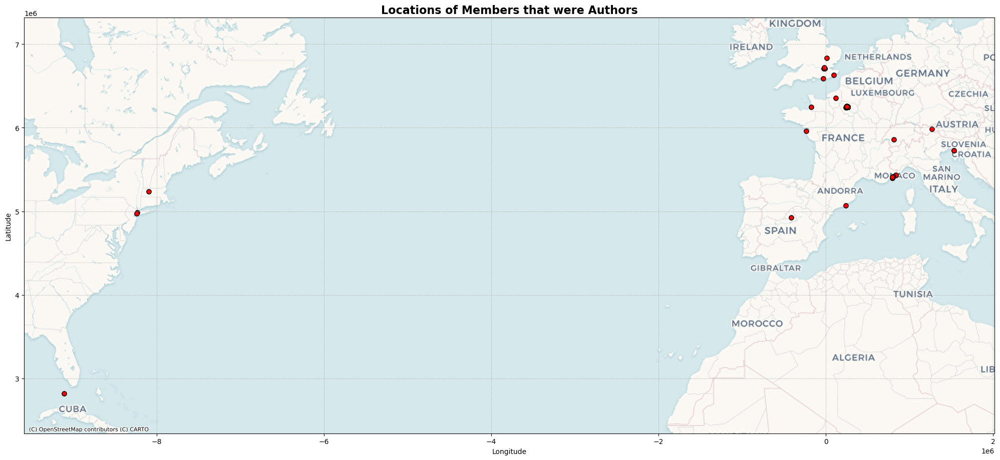

In [13]:
# Plotting the world map with original bounds + buffer
minx, miny, maxx, maxy = buffered_gdf.total_bounds
plot_map(gdf, world_map, (minx, miny, maxx, maxy), 'Locations of Members that were Authors', 4)

In [14]:
# Create a Transformer instance only once
transformer = Transformer.from_crs("epsg:4326", "epsg:3857", always_xy=True)

def transform_bounds(bounds):
    """
    Transforms the coordinates of the given bounds using a predefined transformer.

    Args:
        bounds (tuple): A tuple containing two tuples, each with two float elements representing coordinates 
                        (e.g., ((x1, y1), (x2, y2))).

    Returns:
        tuple: A tuple containing two transformed coordinate tuples.
    """
    return transformer.transform(bounds[0][0], bounds[0][1]), transformer.transform(bounds[1][0], bounds[1][1])

In [15]:
def sort_names(names):
    """
    Sorts a list of names in "last, first" format and returns a single string
    with names in "first last" format, joined by "and".

    Args:
        names (list of str): List of names in "last, first" format.

    Returns:
        str: A single string with names in "first last" format, joined by "and".
    """
    # Sort and handle names in "last, first" order
    sorted_names = sorted(
        [(name.split(", ") if ", " in name else [name, '']) for name in names],  # Parenthesized generator expression
        key=lambda x: (x[1], x[0])  # Sort by last name, then first name
    )
    # Rejoin names as "first last" and join with "and"
    return ", ".join([f"{last} {first}" for first, last in sorted_names])

In [16]:
def extract_and_group_by_city(gdf, bounds, region_name="Region"):
    """
    Extracts and groups names, coordinates, and addresses of individuals within a specified bounding box by city.

    Parameters:
    - gdf (GeoDataFrame): A GeoDataFrame containing the data.
    - bounds (tuple): A tuple of the form ((minx, miny), (maxx, maxy)) defining the bounding box.
    - region_name (str): A name for the region (e.g., "USA", "Europe").

    Returns:
    - grouped_data (DataFrame): A DataFrame grouped by city with author-members' names and aggregated coordinates.
    """
    # Create the bounding box
    (minx, miny), (maxx, maxy) = bounds
    bbox = box(minx, miny, maxx, maxy)
    
    # Filter the GeoDataFrame for individuals within the bounding box
    region_gdf = gdf[gdf.within(bbox)][['sort_name', 'latitude', 'longitude', 'address']]
    
    # Extract city names more robustly
    def extract_city(address):
        if ',' in address:
            return address.split(',')[-1].strip()  # Take the last part after a comma
        return address.strip()  # If no comma, assume the whole address is the city
    
    region_gdf['city'] = region_gdf['address'].apply(extract_city)
    
    # Deduplicate names and group by city
    grouped_data = region_gdf.groupby('city').agg({
        'sort_name': lambda x: sort_names(list(set(x))),  # Deduplicate names and format
    }).reset_index()
    
    return grouped_data

In [17]:
# Define bounding box coordinates for USA, Europe and Paris
usa_bounds = [(-85, 22), (-65, 45)]
europe_bounds = [(-5, 40), (15, 55)]
paris_bounds = [(2.1529, 48.7779), (2.4769, 48.9219)]

# Transform the bounds for both regions
usa_bounds_3857 = transform_bounds(usa_bounds)
europe_bounds_3857 = transform_bounds(europe_bounds)
paris_bounds_3857 = transform_bounds(paris_bounds)

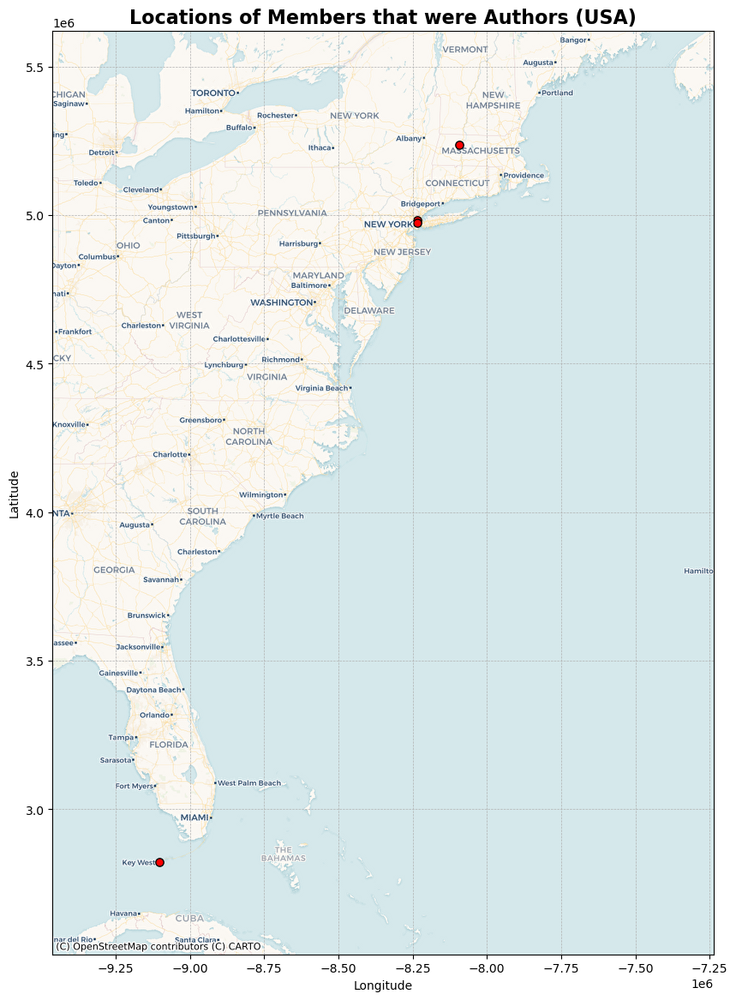

In [18]:
# Plotting the world map with the USA and Europe bounds
plot_map(gdf, world_map, usa_bounds_3857[0] + usa_bounds_3857[1], 'Locations of Members that were Authors (USA)', 6)

In [19]:
usa_grouped = extract_and_group_by_city(gdf, usa_bounds_3857, region_name="USA")

print("Grouped by City (USA):")
print(usa_grouped)

Grouped by City (USA):
       city                            sort_name
0    Conway                   Archibald MacLeish
1  Key West                     Ernest Hemingway
2  New York  Archibald MacLeish, Ford Madox Ford


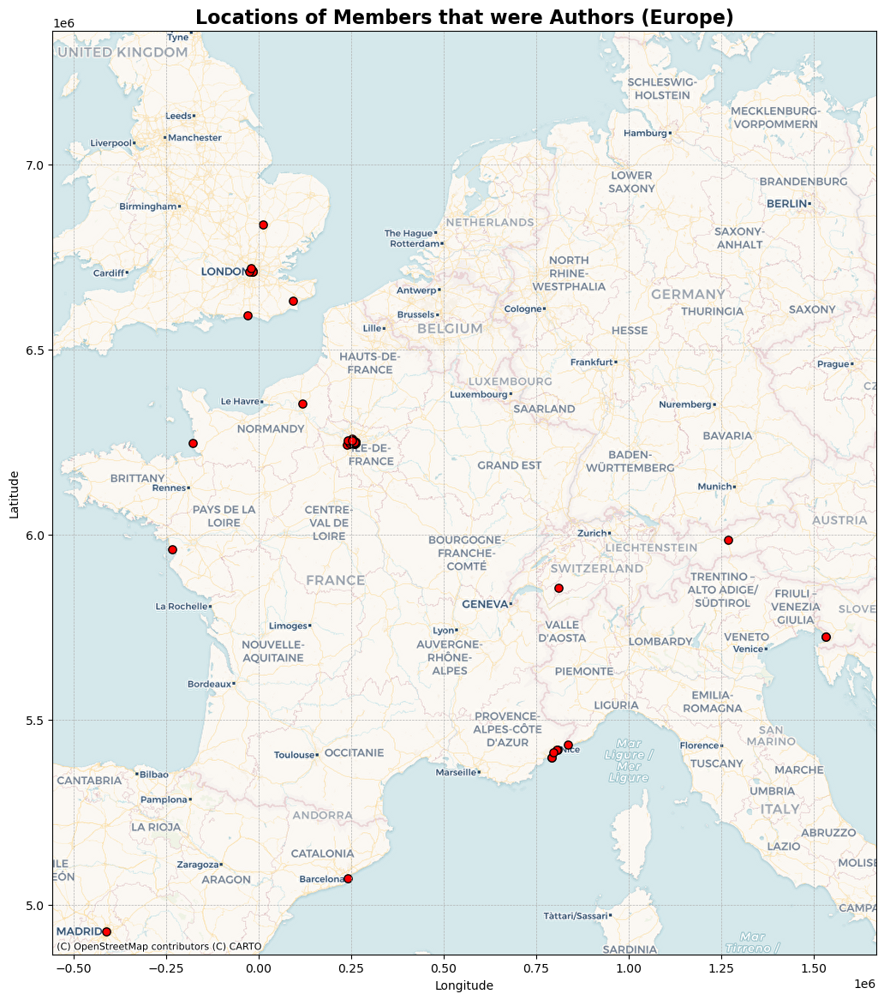

In [20]:
plot_map(gdf, world_map, europe_bounds_3857[0] + europe_bounds_3857[1], 'Locations of Members that were Authors (Europe)', 6)

In [ ]:
europe_grouped = extract_and_group_by_city(gdf, europe_bounds_3857, region_name="Europe")

print("Grouped by City (Europe):")
print(europe_grouped)

Grouped by City (Europe):
                 city                                          sort_name
0             Antibes               Archibald MacLeish, Ernest Hemingway
1           Barcelona                                   Ernest Hemingway
2      Cagnes-sur-Mer                                     Gertrude Stein
3           Cambridge                                        C. K. Ogden
4          Courbevoie                                     Stuart Gilbert
5           Granville                                 Archibald MacLeish
6              Gstaad                                   Ernest Hemingway
7           Innsbruck                                        James Joyce
8              London  Anna Wickham, C. K. Ogden, Cyril Connolly, Rob...
9              Madrid                                   Ernest Hemingway
10             Menton                               Richard Le Gallienne
11  Neuilly-sur-Seine    Louis Aragon, Mary Cable Dennis, Richard Wright
12               Nice    

In [22]:
author_in_city = europe_grouped[europe_grouped['city'] == "London"]['sort_name'].unique()

print(author_in_city)

['Anna Wickham, C. K. Ogden, Cyril Connolly, Robert McAlmon, Samuel Beckett, Stephen Spender']


world data from https://www.kaggle.com/datasets/venkatkumar001/geographical-data/data

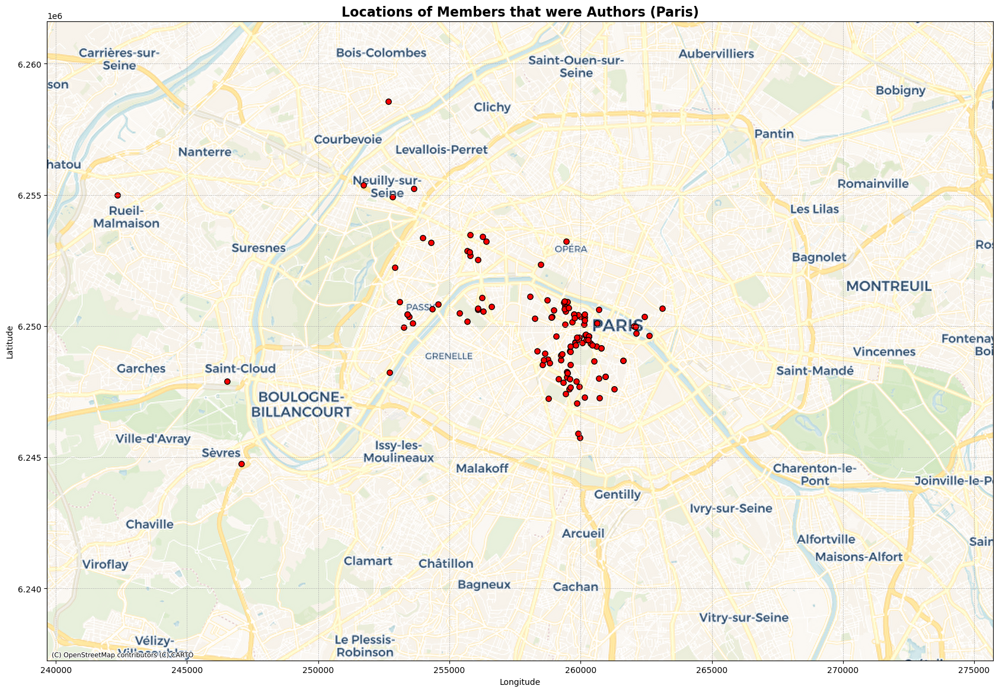

In [23]:
plot_map(gdf, world_map, paris_bounds_3857[0] + paris_bounds_3857[1], 'Locations of Members that were Authors (Paris)', 12)

### Shared Addresses

In [ ]:
# Perform grouping and aggregation, preserving the geometry
grouped = gdf.groupby('geometry').agg(
    names=('sort_name', lambda x: sort_names(sorted(x))),
    count=('sort_name', 'size'),  # Count the number of names per address
    address=('address', 'first')  # Keep the first address for each geometry
).reset_index()

# Convert back to GeoDataFrame (geometry is already included in the grouping key)
grouped_gdf = gpd.GeoDataFrame(grouped, geometry='geometry', crs=gdf.crs)

# Filter only the shared addresses (count > 1)
grouped_gdf = grouped_gdf[grouped_gdf['count'] > 1]

# Filter based on x-coordinate, only keep rows where x-coordinate <= 280,000
grouped_gdf = grouped_gdf[grouped_gdf.geometry.apply(
    lambda x: x.is_empty or (x.x <= 280000 if x.geom_type == 'Point' else True)
)]

# Check the result
print(grouped_gdf)

                           geometry  \
22   POINT (261626.407 6248693.287)   
36   POINT (260936.226 6248067.437)   
60   POINT (253392.104 6250440.840)   
94   POINT (258881.268 6250339.327)   
98   POINT (259745.107 6250456.067)   
121  POINT (260315.063 6249603.391)   
128  POINT (260787.058 6249168.627)   

                                                 names  count  \
22                         James Joyce, Valery Larbaud      2   
36                    Samuel Beckett, Thomas MacGreevy      2   
60                        James Joyce, Pierre de Lanux      2   
94              Margaret Wilson, Stephen Vincent Benét      2   
98                    David Gascoyne, Ernest Hemingway      2   
121  George Antheil, Padraic Colum, Robert McAlmon,...      4   
128             Katherine Mansfield, Richard Aldington      2   

                                           address  
22               71 rue du Cardinal Lemoine, Paris  
36   École normale supérieure, 45 rue d'Ulm, Paris  
60     

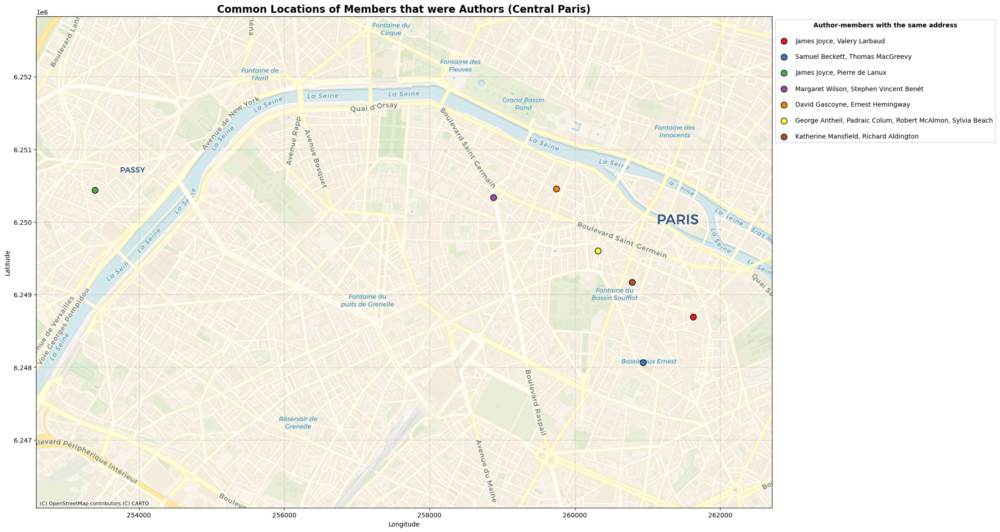

In [25]:
paris_central_bounds = [(2.269, 48.83), (2.36, 48.87)]

# Transform the bounds for both regions
paris_central_bounds_3857 = transform_bounds(paris_central_bounds)

# Plot the map with legend
plot_map(grouped_gdf, world_map, paris_central_bounds_3857[0] + paris_central_bounds_3857[1], title='Common Locations of Members that were Authors (Central Paris)', zoom=14, name_col='names')

https://data.metabolismofcities.org/library/maps/38838/view/

## Statistical Analysis

The statistical analysis involves the nationalities distribution of the author-members, the gender ditrubution, as well as the birth year distribution. For each of these distributions, the following steps will be performed:
* Calculation of the distribution
* Visualization
* Mode
* Entropy

### Nationalities

In [26]:
member_is_author.nationalities.sample(3)

1002    Ireland;United States
585     France;United Kingdom
405             United States
Name: nationalities, dtype: object

In [27]:
# Step 1: Handle NaN and split multiple nationalities
nationalities_df = member_is_author.copy()  # Work with a copy of the DataFrame
nationalities_df['nationalities'] = nationalities_df['nationalities'].fillna('Unknown')

# Step 2: Split the nationalities into separate rows
split_nationalities = nationalities_df['nationalities'].str.split(';', expand=True)

# Stack to create new rows for each nationality
split_nationalities = split_nationalities.stack().reset_index(level=1, drop=True).rename('nationalities')

# Join the new rows back with the rest of the DataFrame
cleaned_nationalities_df = nationalities_df.drop('nationalities', axis=1).join(split_nationalities)

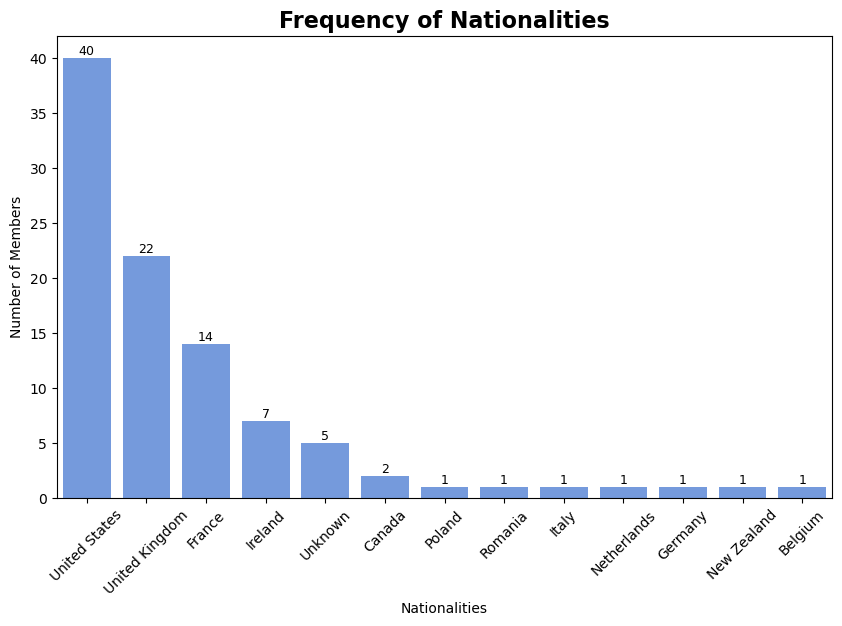

In [28]:
nationality_counts = cleaned_nationalities_df['nationalities'].value_counts()

# Plotting
plt.figure(figsize=(10, 6))
ax = sns.barplot(x=nationality_counts.index, y=nationality_counts.values, color='cornflowerblue')
plt.title('Frequency of Nationalities', fontsize=16, fontweight='bold')
plt.xlabel('Nationalities')
plt.ylabel('Number of Members')
plt.xticks(rotation=45)
for i, count in enumerate(nationality_counts.values):
    ax.text(i, count, str(count), ha='center', va='bottom', fontsize=9)
plt.show()

In [29]:
# Group by nationality and aggregate the sort_name column
names_by_nationality = (
    cleaned_nationalities_df.groupby('nationalities')
    .agg({'sort_name': lambda x: sort_names(list(set(x)))})  # Deduplicate and format names
    .reset_index()
)

print(names_by_nationality)

     nationalities                                          sort_name
0          Belgium                                      Henri Michaux
1           Canada                        Leon Edel, Morley Callaghan
2           France  André Gide, Eugene Jolas, Henri Michaux, Jean ...
3          Germany                                    Ludwig Lewisohn
4          Ireland  Austin Clarke, James Joyce, Kathleen Coyle, Pa...
5            Italy                                   Stanislaus Joyce
6      Netherlands                                        Odette Keun
7      New Zealand                                Katherine Mansfield
8           Poland                                        Nathan Asch
9          Romania                                   Konrad Bercovici
10  United Kingdom   Bryher, Anna Wickham, C. K. Ogden, Cyril Conn...
11   United States  Allen Tate, Archibald MacLeish, Djuna Barnes, ...
12         Unknown  Elizabeth Clark, Frank Harris, Louis Bromfield...


In [30]:
author_by_nationality = names_by_nationality[names_by_nationality['nationalities'] == 'Ireland']['sort_name'].unique()

print(author_by_nationality)

['Austin Clarke, James Joyce, Kathleen Coyle, Padraic Colum, Samuel Beckett, Stanislaus Joyce, Thomas MacGreevy']


In [31]:
percentages = cleaned_nationalities_df['nationalities'].value_counts(normalize=True) * 100
print(percentages)

United States     41.237113
United Kingdom    22.680412
France            14.432990
Ireland            7.216495
Unknown            5.154639
Canada             2.061856
Poland             1.030928
Romania            1.030928
Italy              1.030928
Netherlands        1.030928
Germany            1.030928
New Zealand        1.030928
Belgium            1.030928
Name: nationalities, dtype: float64


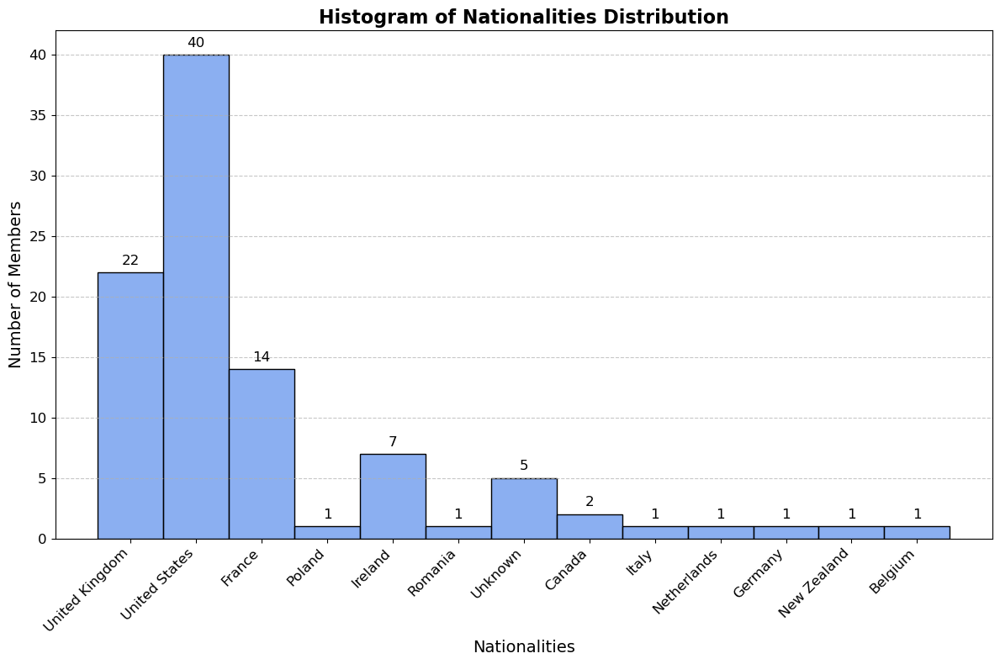

In [32]:
# Calculate the frequency of each nationality
nationality_counts = cleaned_nationalities_df['nationalities'].value_counts()

# Plotting the histogram
plt.figure(figsize=(12, 8))
ax = sns.histplot(data=cleaned_nationalities_df, x='nationalities', kde=False, color='cornflowerblue', discrete=True)

# Customize the plot
plt.title('Histogram of Nationalities Distribution', fontsize=16, fontweight='bold')
plt.xlabel('Nationalities', fontsize=14)
plt.ylabel('Number of Members', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Add count labels on the bars
for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()), 
                ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=12)

# Display the plot
plt.tight_layout()
plt.show()

#### Mode

In [33]:
mode_nationalities = cleaned_nationalities_df['nationalities'].value_counts().idxmax() # mode
print(f"Mode of nationalities distribution: {mode_nationalities}")

Mode of nationalities distribution: United States


#### Entropy

In [34]:
def calculate_entropy(distribution):
    """
    Calculate the entropy of a given distribution.

    Parameters:
        distribution (array-like): A probability distribution for which the entropy is to be calculated.

    Returns:
        float: The entropy of the distribution.

    Raises:
        ValueError: If the distribution is not valid or if it contains negative probabilities.
    """
    return entropy(distribution)

def calculate_max_entropy(num_categories):
    """
    Calculate the maximum possible entropy for a given number of categories.

    Entropy is a measure of the uncertainty or randomness in a system. The maximum entropy is achieved when all categories are equally likely.

    Parameters:
        num_categories (int): The number of categories.

    Returns:
        float: The maximum possible entropy for the given number of categories.

    Raises:
        ValueError: If num_categories is not a positive integer.
    """
    return np.log(num_categories)

def calculate_normalized_entropy(distribution):
    """
    Calculate the normalized entropy of a given distribution.

    Normalized entropy is the ratio of the entropy of the distribution to the 
    maximum possible entropy for a distribution of the same size. This value 
    ranges from 0 to 1, where 0 indicates no entropy (completely predictable 
    distribution) and 1 indicates maximum entropy (completely unpredictable 
    distribution).

    Args:
        distribution (list or array-like): The distribution for which to 
        calculate the normalized entropy.

    Returns:
        float: The normalized entropy of the distribution.
    """
    ent = calculate_entropy(distribution)
    max_ent = calculate_max_entropy(len(distribution))
    return ent / max_ent

In [35]:
nationalities_counts = cleaned_nationalities_df['nationalities'].value_counts(normalize=True)

entropy_nationalities = calculate_entropy(nationalities_counts)

max_entropy_nationalities = calculate_max_entropy(len(nationalities_counts))

normalized_entropy_nationalities = calculate_normalized_entropy(nationalities_counts)

print(f"Entropy of nationalities distribution: {entropy_nationalities}")

print(f"Maximum possible entropy with {len(nationalities_counts)} categories: {max_entropy_nationalities}")

print(f"Normalized entropy: {normalized_entropy_nationalities}")

Entropy of nationalities distribution: 1.7338886102587268
Maximum possible entropy with 13 categories: 2.5649493574615367
Normalized entropy: 0.6759933116085812


### Gender

In [36]:
count_gender = member_is_author['gender'].value_counts().sort_index()  # operate on series ; count

In [37]:
percentages = member_is_author['gender'].value_counts(normalize=True) * 100
print(percentages)

Male      76.190476
Female    23.809524
Name: gender, dtype: float64


#### Mode

In [38]:
mode_gender = member_is_author['gender'].value_counts().idxmax() # mode
print(f"Mode of gender distribution: {mode_gender}")

Mode of gender distribution: Male


#### Entropy

In [39]:
gender_counts = member_is_author['gender'].value_counts(normalize=True)
entropy_gender = calculate_entropy(gender_counts)

# Calculate the number of unique categories (genders)
num_categories = gender_counts.size

# Calculate the maximum possible entropy
max_entropy = calculate_max_entropy(num_categories)

# Calculate the normalized entropy (entropy divided by maximum possible entropy)
normalized_entropy = calculate_normalized_entropy(gender_counts)

# Print the entropy and the benchmark
print(f"Normalized entropy: {normalized_entropy}")
print(f"Entropy of gender distribution: {entropy_gender}")
print(f"Maximum possible entropy with {num_categories} categories: {max_entropy}")

Normalized entropy: 0.7918583525674836
Entropy of gender distribution: 0.5488743844849944
Maximum possible entropy with 2 categories: 0.6931471805599453


### Birth Years

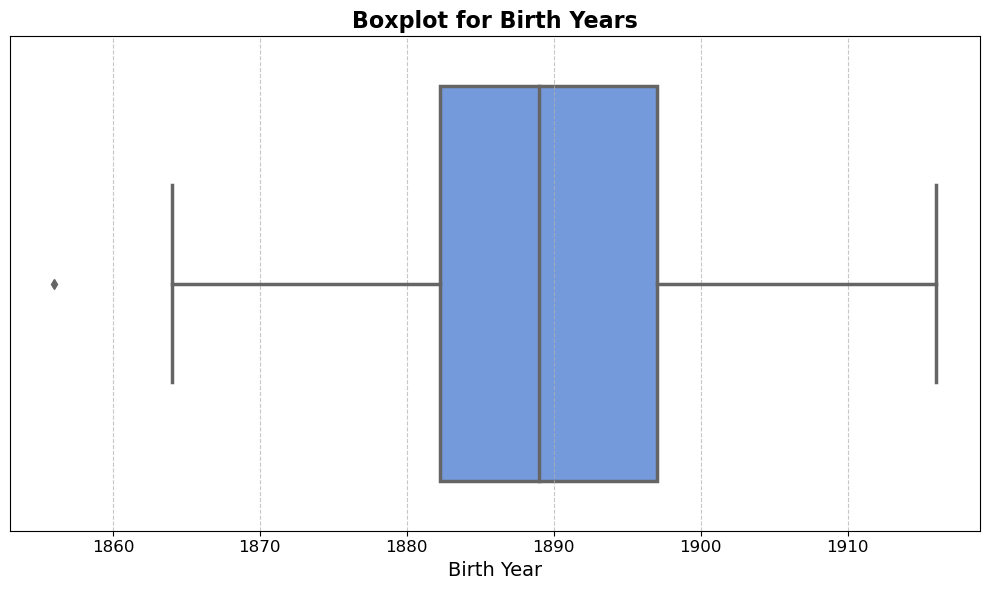

In [40]:
# Cleaning: Remove NaN values
birth_years_df = member_is_author.dropna(subset=['birth_year']).copy()

# Convert birth_year to integer
birth_years_df['birth_year'] = birth_years_df['birth_year'].astype(int)

# Plotting a boxplot with improved styling
plt.figure(figsize=(10, 6))
sns.boxplot(x=birth_years_df['birth_year'], color='cornflowerblue', fliersize=5, linewidth=2.5)
plt.title('Boxplot for Birth Years', fontsize=16, fontweight='bold')
plt.xlabel('Birth Year', fontsize=14)
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(fontsize=12)
plt.yticks([])
plt.tight_layout()
plt.show()

In [41]:
# Group birth years into bins (e.g., by decade)
birth_years_df['birth_year_group'] = pd.cut(birth_years_df['birth_year'], bins=np.arange(1850, 1920, 10))

# Calculate the normalized value counts for each bin
birth_year_group_counts = birth_years_df['birth_year_group'].value_counts(normalize=True)

# Calculate the entropy of the birth year distribution
entropy_birth_year = calculate_entropy(birth_year_group_counts)

# Calculate the number of unique bins
num_bins = birth_year_group_counts.size

# Calculate the maximum possible entropy
max_entropy = calculate_max_entropy(num_bins)

# Calculate the normalized entropy
normalized_entropy = calculate_normalized_entropy(birth_year_group_counts)

# Print the results
print(f"Entropy of birth year distribution: {entropy_birth_year}")
print(f"Maximum possible entropy with {num_bins} bins: {max_entropy}")
print(f"Normalized entropy: {normalized_entropy}")

Entropy of birth year distribution: 1.4401361309075074
Maximum possible entropy with 6 bins: 1.791759469228055
Normalized entropy: 0.803755278339878


#### Mode

In [42]:
print(member_is_author['birth_year'].mean())
print(member_is_author['birth_year'].median())
print(member_is_author['birth_year'].mode())

1888.8658536585365
1889.0
0    1883.0
1    1888.0
2    1892.0
3    1899.0
Name: birth_year, dtype: float64


!! multimodal !!

In [ ]:
# Calculate the percentage for each birth year group
birth_year_group_percentages = birth_year_group_counts * 100

# Sort by decade for better readability
birth_year_group_percentages = birth_year_group_percentages.sort_index()

# Display the percentages in plain text
for decade, percentage in birth_year_group_percentages.items():
    print(f"{decade}: {percentage:.2f}%")

(1850, 1860]: 1.23%
(1860, 1870]: 4.94%
(1870, 1880]: 12.35%
(1880, 1890]: 34.57%
(1890, 1900]: 35.80%
(1900, 1910]: 11.11%


## Books per Author-Member

In [44]:
member_is_author.shape

(84, 19)

In [45]:
member_is_author.columns

Index(['uri', 'name', 'sort_name', 'title', 'gender', 'is_organization',
       'has_card', 'birth_year', 'death_year', 'membership_years', 'viaf_url',
       'wikipedia_url', 'nationalities', 'addresses', 'postal_codes',
       'arrondissements', 'coordinates', 'notes', 'updated'],
      dtype='object')

### Overall comparison of books by members

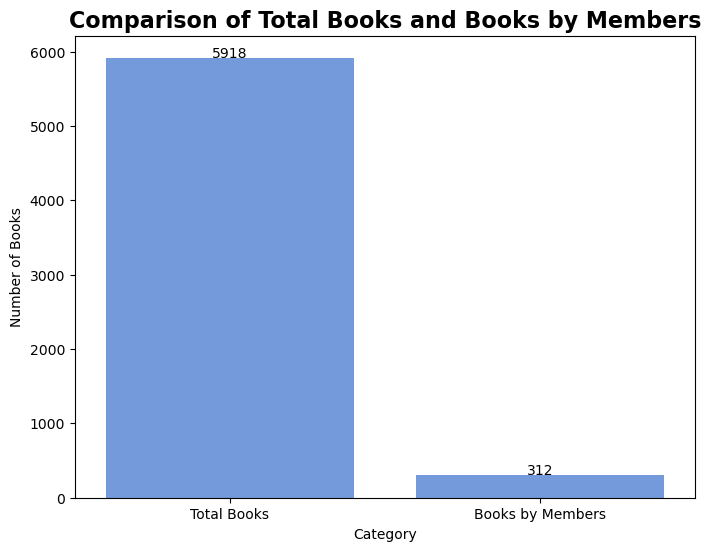

In [46]:
books_by_member = books[books['author'].isin(member_is_author['sort_name'])]

# Calculate the number of unique titles
total_unique_titles = len(books['title'].unique())
unique_titles_by_member = len(books_by_member['title'].unique())

# Prepare data for plotting
data = pd.DataFrame({
    'Category': ['Total Books', 'Books by Members'],
    'Count': [total_unique_titles, unique_titles_by_member]
})

# Plot the diagram
plt.figure(figsize=(8, 6))
barplot = sns.barplot(x='Category', y='Count', data=data, color='cornflowerblue')
for index, row in data.iterrows():
    barplot.text(index, row.Count, round(row.Count, 2), color='black', ha="center")
plt.ylabel('Number of Books')
plt.title('Comparison of Total Books and Books by Members', fontsize=16, fontweight='bold')
plt.show()

In [47]:
# Calculate the percentage of unique titles by members out of the total
percentage_of_books_by_members = (unique_titles_by_member / total_unique_titles) * 100

# Prepare a dictionary with the results
book_counts_summary = {
    'Total Books': total_unique_titles,
    'Books by Members': unique_titles_by_member,
    'Percentage of Books by Members': f'{percentage_of_books_by_members:.2f}%'
}

# Display the dictionary
book_counts_summary

{'Total Books': 5918,
 'Books by Members': 312,
 'Percentage of Books by Members': '5.27%'}

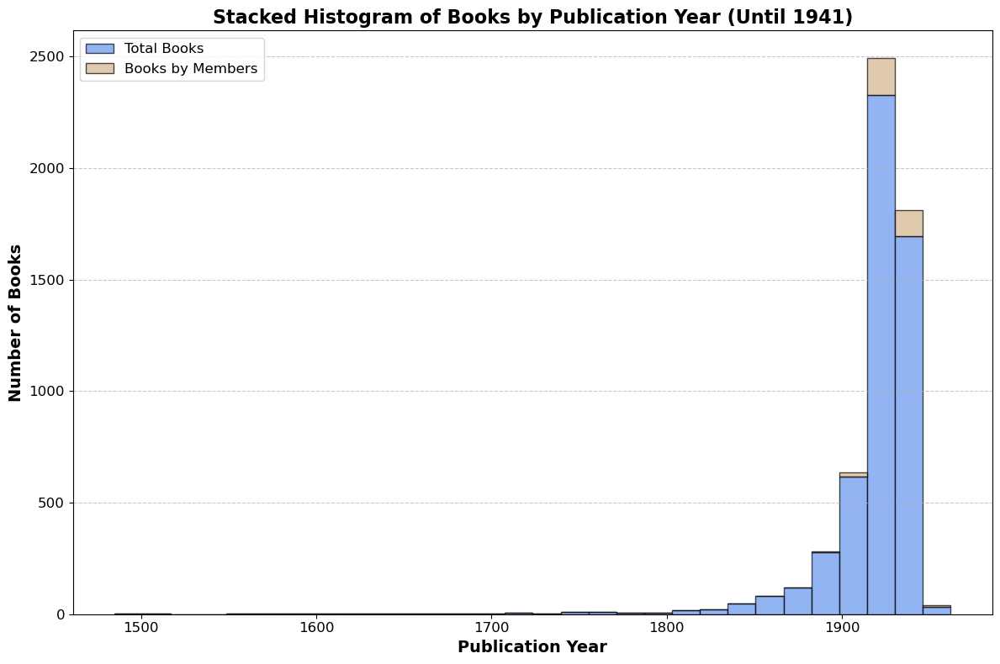

In [48]:
# Filter the books dataframe to keep only the rows where the author is in the list of authors who are members

# Drop rows with missing values in the 'year' column for both datasets
books = books.dropna(subset=['year'])
books_by_member = books_by_member.dropna(subset=['year'])

# Convert 'year' to integer (or the appropriate type if not already)
books['year'] = books['year'].astype(int)
books_by_member['year'] = books_by_member['year'].astype(int)

# Prepare data for plotting
all_books = books['year']
member_books = books_by_member['year']

# Plot the stacked histogram with improved styling
plt.figure(figsize=(12, 8))
plt.hist([all_books, member_books], bins=30, stacked=True, label=['Total Books', 'Books by Members'], color=['cornflowerblue', 'tan'], edgecolor='black', alpha=0.7)
plt.xlabel('Publication Year', fontsize=14, fontweight='bold')
plt.ylabel('Number of Books', fontsize=14, fontweight='bold')
plt.title('Stacked Histogram of Books by Publication Year (Until 1941)', fontsize=16, fontweight='bold')
plt.legend(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

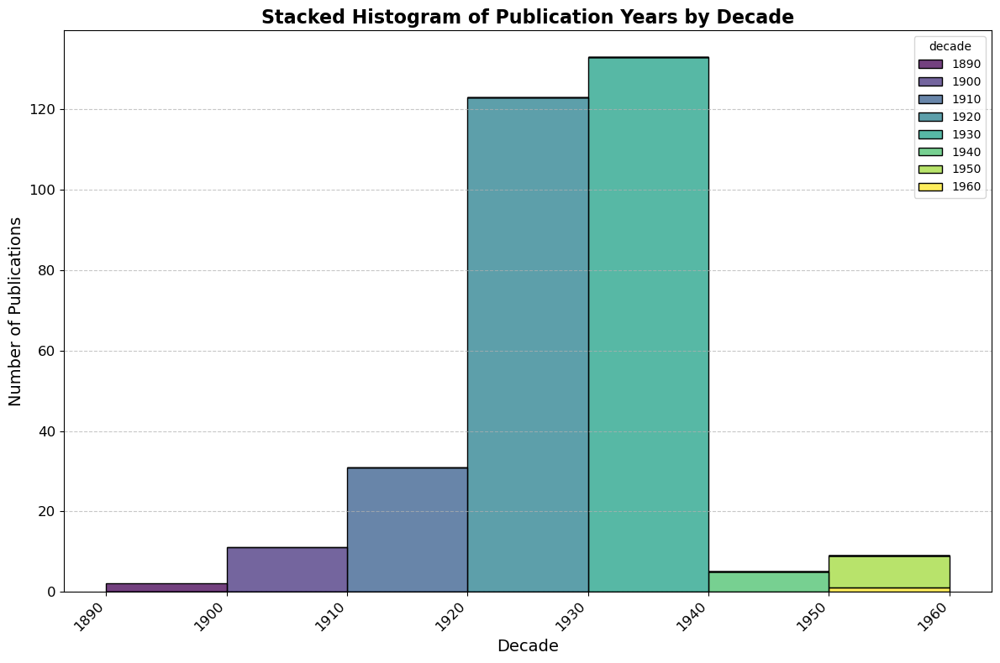

In [49]:
# Create a new column for the decade
books_by_member['decade'] = (books_by_member['year'] // 10) * 10

# Plotting the stacked histogram
plt.figure(figsize=(12, 8))
sns.histplot(data=books_by_member, x='decade', hue='decade', multiple='stack', palette='viridis', binwidth=10)

# Customize the plot
plt.title('Stacked Histogram of Publication Years by Decade', fontsize=16, fontweight='bold')
plt.xlabel('Decade', fontsize=14)
plt.ylabel('Number of Publications', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Display the plot
plt.tight_layout()
plt.show()

In [50]:
bin_edges = np.linspace(min(all_books.min(), member_books.min()), 1962, 31)  # Create 30 bins from min year to 1941
all_books_counts, _ = np.histogram(all_books, bins=bin_edges)
member_books_counts, _ = np.histogram(member_books, bins=bin_edges)

# Output the bin edges and counts
for i, edge in enumerate(bin_edges[:-1]):
    print(f"From {int(edge)} to {int(bin_edges[i+1])} - Total Books: {all_books_counts[i]}, Books by Members: {member_books_counts[i]}")

From 1485 to 1500 - Total Books: 1, Books by Members: 0
From 1500 to 1516 - Total Books: 1, Books by Members: 0
From 1516 to 1532 - Total Books: 0, Books by Members: 0
From 1532 to 1548 - Total Books: 0, Books by Members: 0
From 1548 to 1564 - Total Books: 1, Books by Members: 0
From 1564 to 1580 - Total Books: 2, Books by Members: 0
From 1580 to 1596 - Total Books: 4, Books by Members: 0
From 1596 to 1612 - Total Books: 3, Books by Members: 0
From 1612 to 1628 - Total Books: 2, Books by Members: 0
From 1628 to 1644 - Total Books: 2, Books by Members: 0
From 1644 to 1659 - Total Books: 3, Books by Members: 0
From 1659 to 1675 - Total Books: 1, Books by Members: 0
From 1675 to 1691 - Total Books: 2, Books by Members: 0
From 1691 to 1707 - Total Books: 1, Books by Members: 0
From 1707 to 1723 - Total Books: 5, Books by Members: 0
From 1723 to 1739 - Total Books: 4, Books by Members: 0
From 1739 to 1755 - Total Books: 12, Books by Members: 0
From 1755 to 1771 - Total Books: 9, Books by Me

#### How many books does each author have?

In [ ]:
# Filter the DataFrame to include only rows where the format is 'Book'
books_by_member_books = books_by_member[books_by_member['format'] == 'Book']

# Group the filtered DataFrame by 'author' and count the number of titles for each author
books_count_by_author = books_by_member_books.groupby('author').count()['title'].sort_values(ascending=False)

# Optionally, you might want to reset the index to make the data more presentable
books_count_by_author = books_count_by_author.reset_index()
books_count_by_author.columns = ['author', 'numberOfBooks']

# Display the result
print(books_count_by_author)

                      author  numberOfBooks
0           Ford, Ford Madox             18
1                Pound, Ezra             16
2           Bromfield, Louis             11
3            Stein, Gertrude             11
4               Joyce, James             11
..                       ...            ...
79        Bishop, John Peale              1
80             Beach, Sylvia              1
81  Barney, Natalie Clifford              1
82            McKenney, Ruth              1
83          de Lanux, Pierre              1

[84 rows x 2 columns]


In [52]:
books_count_by_author.head(7)

,author,numberOfBooks
0,"Ford, Ford Madox",18
1,"Pound, Ezra",16
2,"Bromfield, Louis",11
3,"Stein, Gertrude",11
4,"Joyce, James",11
5,"Hemingway, Ernest",10
6,"McAlmon, Robert",10


In [53]:
highest_books_count = books_count_by_author.nlargest(20, 'numberOfBooks')

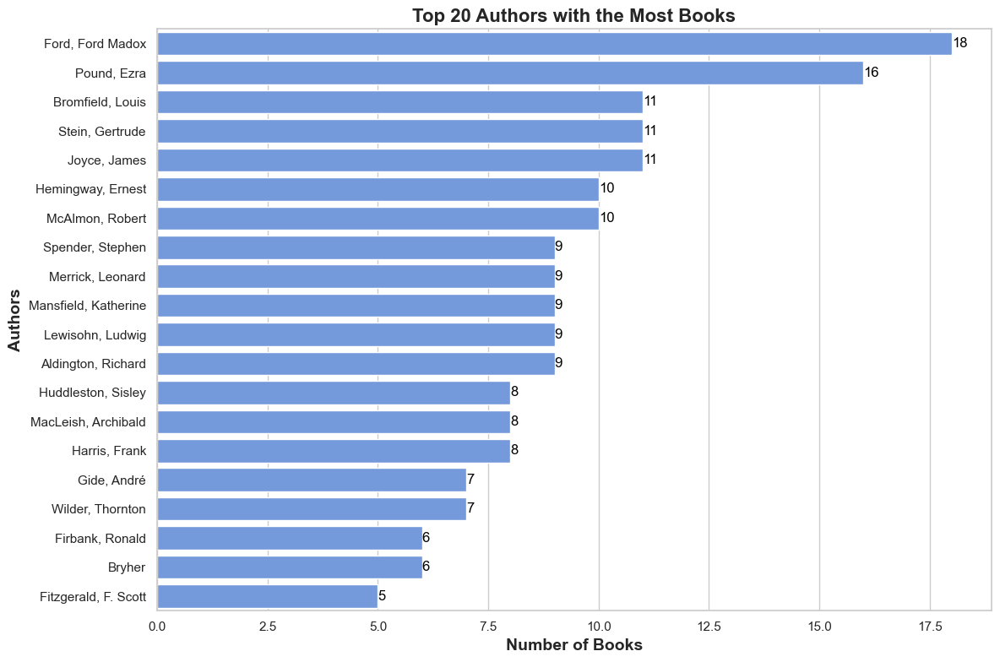

In [54]:
# Create the plot with a modern style
plt.figure(figsize=(12, 8))  # Set the figure size
sns.set(style="whitegrid")  # Set the seaborn style

# Create the bar plot
bar_plot = sns.barplot(x='numberOfBooks', y='author', data=highest_books_count, color='cornflowerblue')

# Add labels and title with improved styling
plt.xlabel('Number of Books', fontsize=14, fontweight='bold')
plt.ylabel('Authors', fontsize=14, fontweight='bold')
plt.title('Top 20 Authors with the Most Books', fontsize=16, fontweight='bold')

# Add values on the bars for better readability
for index, value in enumerate(highest_books_count['numberOfBooks']):
    bar_plot.text(value, index, f'{value}', color='black', ha="left", va="center", fontsize=12)

# Improve layout and show the plot
plt.tight_layout()
plt.show()

In [55]:
# Filter the DataFrame to include only books by the specific author
books_by_specific_author = books_by_member_books[books_by_member_books['author'].str.contains('Joyce, James', na=False)]

# Display the filtered DataFrame
print(books_by_specific_author.title)

860                                         Chamber Music
1200                                            Dubliners
1305              A Portrait of the Artist as a Young Man
1437                                               Exiles
1985                                              Ulysses
2852                                       Pomes Penyeach
3390                                               Ulysse
3410                                Anna Livia Plurabelle
3451    Haveth Childers Everywhere: Fragment of Work i...
4326              The Mime of Mick, Nick, and the Maggies
5144                                       Finnegans Wake
Name: title, dtype: object


In [56]:
# Filter the DataFrame to include only books by the specific author
books_by_specific_author = books_by_member_books[books_by_member_books['author'].str.contains('Hemingway, Ernest', na=False)]

# Display the filtered DataFrame
print(books_by_specific_author.title)

2140                          Three Stories and Ten Poems
2731                                   The Sun Also Rises
2735                               The Torrents of Spring
2826                                    Men without Women
3216                                   A Farewell to Arms
3780                               Death in the Afternoon
4160                                  Winner Take Nothing
4418                                Green Hills of Africa
4927                                 To Have and Have Not
5061    The Fifth Column and the First Forty-Nine Stories
Name: title, dtype: object


## Network Analysis

### Common Borrows by Author-Members (All Books)

In [ ]:
# Filter events to include only those where the member is an author and the event type is 'Borrow'
member_borrows_author = events[(events['member_sort_names'].isin(member_is_author['sort_name'])) & (events['event_type'] == 'Borrow')]

# Display a random sample of the filtered events
member_borrows_author.sample(1)

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,item_uri,item_title,item_volume,item_authors,item_year,item_notes,source_type,source_citation,source_manifest,source_image
3440,Borrow,1923-10-24,NaN,https://shakespeareandco.princeton.edu/members...,Solita Solano,"Solano, Solita",NaN,NaN,NaN,NaN,...,https://shakespeareandco.princeton.edu/books/v...,The Blind Bow-Boy,NaN,"Van Vechten, Carl",1923.0,NaN,Lending Library Card,"Sylvia Beach, Solita Solano Lending Library Ca...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/bd...


In [58]:
# not necessary for analysis
member_borrows_author.member_sort_names.unique()

array(['Joyce, James', 'Hemingway, Ernest', 'Schlumberger, Jean',
       'Beach, Sylvia', 'Stein, Gertrude', 'Larbaud, Valery',
       'McAlmon, Robert', 'Wilson, Romer', 'Aragon, Louis',
       'Rodker, John', 'Wilder, Thornton', 'Pound, Ezra',
       'Mansfield, Katherine', 'Solano, Solita', 'de Lanux, Pierre',
       'Tree, Iris', 'Wickham, Anna', 'Wilson, Margaret',
       'Le Gallienne, Richard', 'Gilbert, Stuart', 'Boyd, James',
       'Flandrau, Grace', 'Porter, Katherine Anne', 'Lewisohn, Ludwig',
       'Tate, Allen', 'Gascoyne, David', 'Connolly, Cyril',
       'Merrick, Leonard', 'Dennis, Mary Cable', 'Rogers, Samuel',
       'Guilloux, Louis', 'Gramont, Élisabeth de', 'Ford, Ford Madox',
       'Paul, Elliot', 'Michaux, Henri', 'Wright, Richard', 'Gide, André'],
      dtype=object)

In [59]:
def create_pivot_table(data, index, columns, values=None, aggfunc='size', fill_value=0):
    """
    Creates a pivot table from a DataFrame.

    Parameters:
    - data (pd.DataFrame): The input DataFrame.
    - index (str): The column to use as rows in the pivot table.
    - columns (str): The column to use as columns in the pivot table.
    - values (str or None): The column to aggregate. Default is None for count aggregation.
    - aggfunc (str or function): The aggregation function to apply. Default is 'size'.
    - fill_value (scalar): The value to use for missing data. Default is 0.

    Returns:
    - pd.DataFrame: The resulting pivot table.
    """
    return data.pivot_table(index=index, columns=columns, values=values, aggfunc=aggfunc, fill_value=fill_value)

In [60]:
user_book_matrix = create_pivot_table(
    data=member_borrows_author, 
    index='member_sort_names', 
    columns='item_title'
)

print(user_book_matrix.sample(2))

item_title            A Bookman's Daybook  A Companion Volume  \
member_sort_names                                               
Hemingway, Ernest                       1                   0   
Mansfield, Katherine                    0                   0   

item_title            A Concise History of Ireland  \
member_sort_names                                    
Hemingway, Ernest                                0   
Mansfield, Katherine                             0   

item_title            A Dark Lantern: A Story with a Prologue  \
member_sort_names                                               
Hemingway, Ernest                                           0   
Mansfield, Katherine                                        0   

item_title            A Farewell to Arms  A Foregone Conclusion  A Gallery  \
member_sort_names                                                            
Hemingway, Ernest                      0                      0          0   
Mansfield, Katherine       

In [61]:
def compute_borrow_counts(matrix, top_n=25):
    """
    Computes the total borrow count for each book and displays the top borrowed books.

    Parameters:
        matrix (DataFrame): The user-book or member-book matrix.
        books (DataFrame): The books dataset containing 'title', 'author', and 'format' columns.
        top_n (int): Number of top borrowed books to display.

    Returns:
        DataFrame: A DataFrame with columns ['book_title', 'author', 'borrow_count'] sorted by borrow count.
    """
    # Sum the borrow counts across all users/members
    borrow_counts = matrix.sum(axis=0).reset_index()
    borrow_counts.columns = ['book_title', 'borrow_count']
    
    # Merge with the books dataset to include the author column
    borrow_counts = borrow_counts.merge(books[['title', 'author']], left_on='book_title', right_on='title', how='left')
    borrow_counts = borrow_counts[['book_title', 'author', 'borrow_count']]
    
    # Display the top N most borrowed books
    top_borrowed = borrow_counts.sort_values(by='borrow_count', ascending=False).head(top_n)
    
    return top_borrowed

In [ ]:
compute_borrow_counts(user_book_matrix, top_n=22)

,book_title,author,borrow_count
393,Saturday Review of Literature,NaN,9
756,transition,NaN,8
710,Thomas De Quincey's Works,NaN,6
211,Hound & Horn,NaN,4
504,The Dial,NaN,4
309,New Masses,NaN,4
32,A Portrait of the Artist as a Young Man,"Joyce, James",4
100,Broom,NaN,4
8,A General History of the Robberies and Murders...,"Johnson, Captain Charles",3
449,The Autobiography of Alice B. Toklas,"Stein, Gertrude",3


In [63]:
books

,uri,title,author,editor,translator,introduction,illustrator,photographer,year,format,uncertain,ebook_url,volumes_issues,notes,event_count,borrow_count,purchase_count,circulation_years,updated
0,https://shakespeareandco.princeton.edu/books/m...,Le Morte d'Arthur,"Malory, Thomas",NaN,NaN,NaN,NaN,NaN,1485,Book,False,https://archive.org/details/mortedarthur02malo,NaN,NaN,7,7,0,1930;1932;1937;1938;1939,2021-11-14T13:57:51.282365+00:00
1,https://shakespeareandco.princeton.edu/books/m...,Utopia,"More, Thomas",NaN,NaN,NaN,NaN,NaN,1516,Book,False,https://archive.org/details/utopiamo00more,NaN,NaN,2,2,0,1930;1950;1951,2021-10-31T17:47:49.103296+00:00
2,https://shakespeareandco.princeton.edu/books/n...,Gorboduc,"Norton, Thomas",NaN,NaN,NaN,NaN,NaN,1561,Book,False,NaN,NaN,NaN,1,1,0,1950,2020-06-29T03:49:47+00:00
3,https://shakespeareandco.princeton.edu/books/l...,Euphues: The Anatomy of Wit,"Lyly, John",NaN,NaN,NaN,NaN,NaN,1578,Book,False,https://archive.org/details/cu31924013122084,NaN,NaN,1,1,0,1941,2021-06-05T15:37:07+00:00
4,https://shakespeareandco.princeton.edu/books/s...,The Shepheard's Calendar,"Spenser, Edmund",NaN,NaN,NaN,NaN,NaN,1579,Book,False,https://archive.org/details/shepheardscalend00...,NaN,NaN,1,1,0,1941,2021-11-06T12:26:04.482734+00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5295,https://shakespeareandco.princeton.edu/books/a...,Les années vingt: Les écrivains Américains à P...,NaN,NaN,NaN,NaN,NaN,NaN,1959,Book,False,NaN,NaN,A catalog for an exhibition at the Center Cult...,1,1,0,1962,2020-07-19T20:08:16+00:00
5296,https://shakespeareandco.princeton.edu/books/b...,Shakespeare and Company,"Beach, Sylvia",NaN,NaN,NaN,NaN,NaN,1959,Book,False,NaN,NaN,NaN,2,2,0,1961,2020-04-30T19:40:21+00:00
5297,https://shakespeareandco.princeton.edu/books/b...,The Vodi,"Braine, John",NaN,NaN,NaN,NaN,NaN,1959,Book,False,NaN,NaN,NaN,1,1,0,1961,2020-04-30T19:40:17+00:00
5298,https://shakespeareandco.princeton.edu/books/m...,Cousin to Human,"Mayhall, Jane",NaN,NaN,NaN,NaN,NaN,1960,Book,False,NaN,NaN,NaN,2,2,0,1960;1961,2020-04-30T19:40:16+00:00


In [64]:
# extract the members that borrowed "Saturdy Review of Literature"
members_borrowed_sat_lit = user_book_matrix[user_book_matrix['Saturday Review of Literature'] > 0].index
members_borrowed_sat_lit

Index(['Hemingway, Ernest'], dtype='object', name='member_sort_names')

In [65]:
# extract the members that borrowed "Saturdy Review of Literature"
members_borrowed_sat_lit = user_book_matrix[user_book_matrix["A Sportsman's Sketches"] > 0].index
members_borrowed_sat_lit

Index(['Hemingway, Ernest'], dtype='object', name='member_sort_names')

In [66]:
# extract the members that borrowed "Saturdy Review of Literature"
members_borrowed_sat_lit = user_book_matrix[user_book_matrix['transition'] > 0].index
members_borrowed_sat_lit

Index(['Gascoyne, David', 'Hemingway, Ernest'], dtype='object', name='member_sort_names')

In [67]:
# extract the members that borrowed "Saturdy Review of Literature"
members_borrowed_sat_lit = user_book_matrix[user_book_matrix["Thomas De Quincey's Works"] > 0].index
members_borrowed_sat_lit

Index(['Michaux, Henri'], dtype='object', name='member_sort_names')

In [68]:
# extract the members that borrowed "Saturdy Review of Literature"
members_borrowed_sat_lit = user_book_matrix[user_book_matrix['Hound & Horn'] > 0].index
members_borrowed_sat_lit

Index(['Gilbert, Stuart', 'Porter, Katherine Anne', 'Rogers, Samuel'], dtype='object', name='member_sort_names')

In [69]:
def create_intersection_graph(matrix, threshold=0):
    """
    Creates a graph based on the intersection of borrowed items between users.

    Parameters:
    - matrix (pd.DataFrame): A DataFrame where rows represent users and columns represent items.
      Values indicate whether a user borrowed an item (e.g., binary or count values).
    - threshold (int): Minimum number of common items required to create an edge.

    Returns:
    - nx.Graph: A NetworkX graph where nodes are users and edges are weighted by the count of common items.
    """
    # Create an empty graph
    H = nx.Graph()

    # Add nodes and edges based on the intersection of borrowed items
    for user1 in matrix.index:
        for user2 in matrix.index:
            if user1 != user2:
                # Calculate intersection of items borrowed by both users
                common_items = sum((matrix.loc[user1] > 0) & (matrix.loc[user2] > 0))
                if common_items > threshold:
                    H.add_edge(user1, user2, weight=common_items)

    return H

In [70]:
# Create the first graph
G = create_intersection_graph(user_book_matrix)
print("Graph G - Number of nodes:", G.number_of_nodes())
print("Graph G - Number of edges:", G.number_of_edges())

Graph G - Number of nodes: 25
Graph G - Number of edges: 58


In this network, each node (person) represents an individual who borrowed books.
An edge between two nodes indicates that these two individuals have borrowed at least one book in common.

In [71]:
def plot_network(X, use_weight=True, k=None, titleAdd='', node_color='thistle', label_weights=False):
    """
    Plots a graph with optional edge weights and customizable node colors.

    Parameters:
    - X (networkx.Graph): The input graph.
    - use_weight (bool): If True, scales edge widths by the weight attribute.
    - k (float): The optimal distance between nodes for the layout.
    - titleAdd (str): Additional text for the title.
    - node_color (str or list): The color of the nodes. Can be a single color or a list of colors.
    - label_weights (bool): If True, labels the edges with their weights.
    """
    plt.figure(figsize=(12, 12))
    pos = nx.spring_layout(X, seed=42, k=k)

    # Check if node_color is a list/array (i.e., for clustering) or a single color
    if isinstance(node_color, str):
        # Use a single color for all nodes
        nx.draw_networkx_nodes(X, pos, node_size=600, node_color=node_color)
    else:
        # Use colormap for clustering
        nx.draw_networkx_nodes(X, pos, node_size=600, node_color=node_color, cmap=plt.cm.viridis)

    if use_weight:
        weights = [X[u][v].get('weight', 1) for u, v in X.edges()]
        nx.draw_networkx_edges(X, pos, width=weights, alpha=0.5)
    else:
        nx.draw_networkx_edges(X, pos, alpha=0.5)

    # Draw labels with a bounding box to avoid overlap
    labels = nx.draw_networkx_labels(X, pos, font_size=8, font_family='sans-serif',
                                     bbox=dict(facecolor='white', boxstyle='round,pad=0.3'))

    # Adjust label positions to avoid overlap
    for _, t in labels.items():
        t.set_bbox(dict(facecolor='white', boxstyle='round,pad=0.3', alpha=0.7, edgecolor='none'))

    # Optionally label the weights on the edges
    if label_weights:
        edge_labels = nx.get_edge_attributes(X, 'weight')
        nx.draw_networkx_edge_labels(X, pos, edge_labels=edge_labels, font_size=10, bbox=dict(facecolor='white', edgecolor='none', alpha=0.6))

    # Ensure all labels are visible and not cut off by the border
    plt.margins(0.1)
    plt.title(f'Network of Users Borrowing the Same Books {titleAdd}', fontsize=16, fontweight='bold')
    # Disable the grid
    plt.grid(False)
    plt.show()

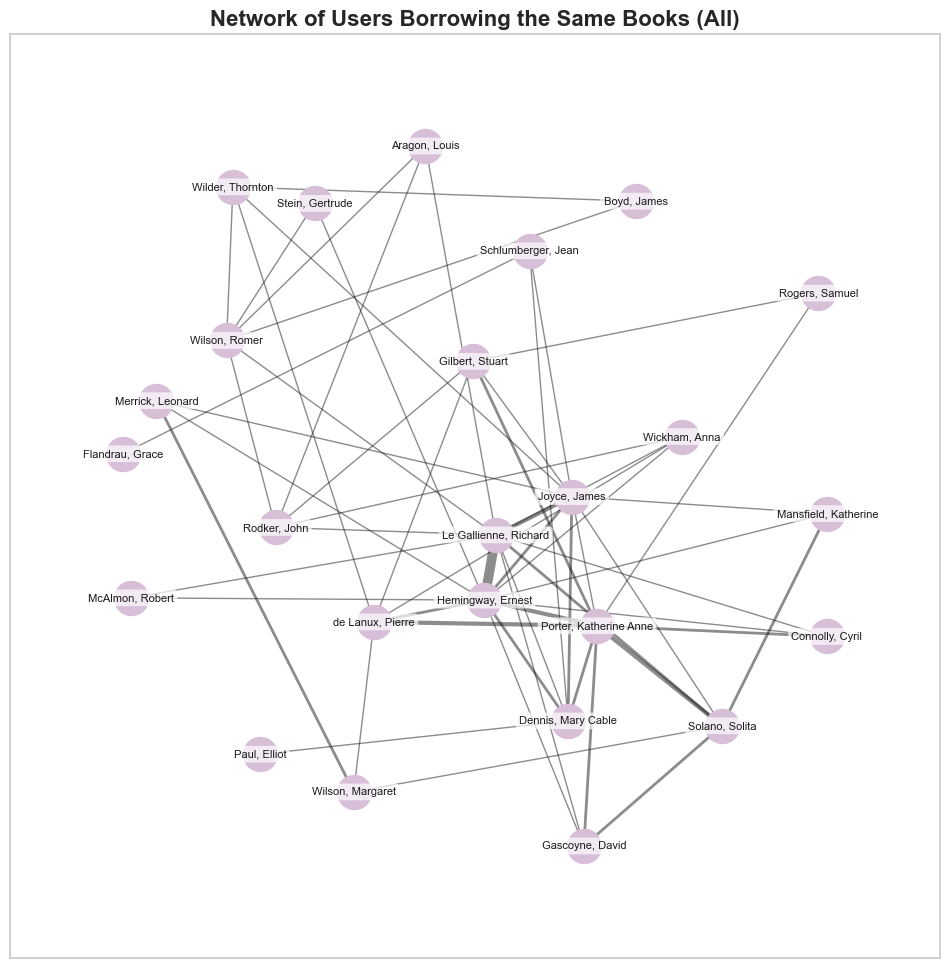

In [72]:
plot_network(G, k=1.7, titleAdd='(All)')

In [73]:
def plot_graph_metric(metric_dict, x_label, y_label, title=None, rotation=90, ylim=None):
    """
    Plots a bar chart for a given graph metric.

    Parameters:
    metric_dict (dict): A dictionary where keys are nodes and values are the metric to plot.
    x_label (str): Label for the x-axis.
    y_label (str): Label for the y-axis.
    title (str, optional): Title of the plot. Defaults to None.
    rotation (int, optional): Rotation angle for x-axis labels. Defaults to 90.
    ylim (tuple, optional): Limits for the y-axis. Defaults to None.

    Returns:
    None
    """
    plt.figure(figsize=(12, 6))
    plt.bar(range(len(metric_dict)), list(metric_dict.values()), align='center', color='cornflowerblue')
    plt.xticks(range(len(metric_dict)), list(metric_dict.keys()), rotation=rotation)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    if ylim:
        plt.ylim(ylim)
    else:
        plt.ylim(0, max(metric_dict.values()) + 1)
    plt.title(title, fontsize=16, fontweight='bold')
    plt.tight_layout()
    plt.show()

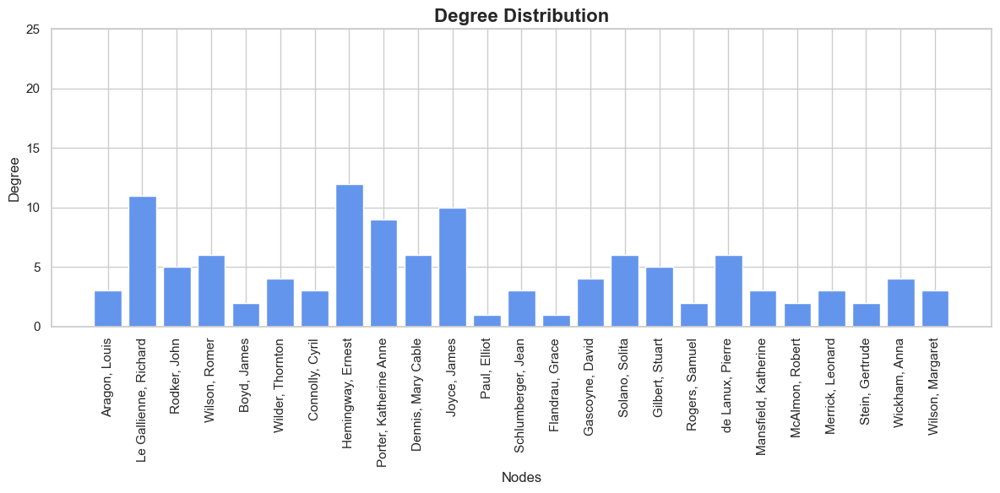

In [74]:
# Degree distribution
degree_dict_g = dict(G.degree())
plot_graph_metric(degree_dict_g, x_label="Nodes", y_label="Degree", title="Degree Distribution", ylim=(0, 25))

Individuals like Le Gallienne, Richard show a significant increase from unweighted to weighted degrees, suggesting that although the number of people he connects with is moderately high, the relationships involve multiple shared books. Conversely, individuals with high unweighted but relatively low weighted degrees might indicate broader but shallower connections.

High values in both metrics, as seen with Hemingway, Ernest, suggest a central figure in the network, likely influencing reading trends or being a core member in their reading community.
ow values in both metrics indicate peripheral figures in the network, potentially with more niche or specialized interests.

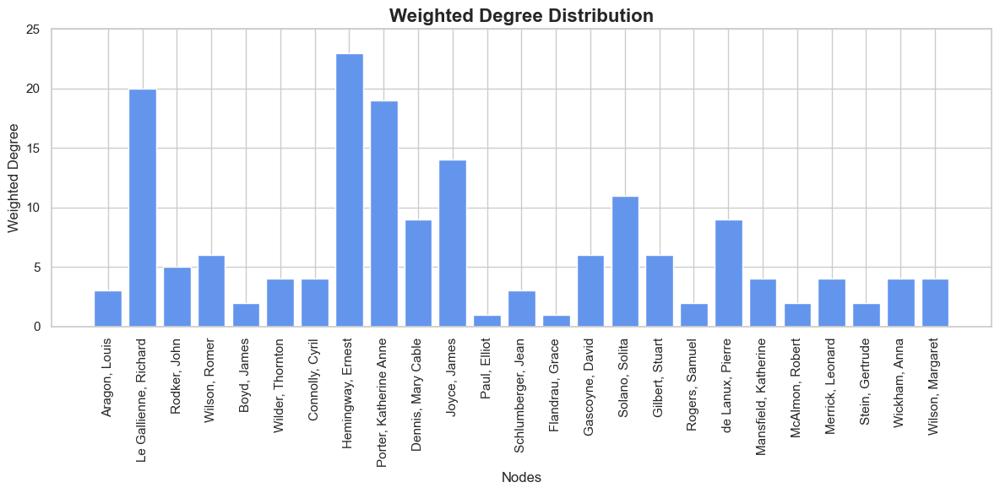

In [75]:
# Weighted degree distribution
weighted_degree_dict_g = dict(G.degree(weight="weight"))
plot_graph_metric(weighted_degree_dict_g, x_label="Nodes", y_label="Weighted Degree", title="Weighted Degree Distribution", ylim=(0, 25))

#### Neighbors

In [76]:
def create_subgraph(graph, user):
    """
    Create a subgraph of the neighbors of a given user.

    Parameters:
    graph (networkx.Graph): The original graph.
    user (str): The user for whom to create the subgraph.

    Returns:
    networkx.Graph: The subgraph containing the neighbors of the given user.
    """
    return nx.subgraph(graph, list(nx.neighbors(graph, user)))

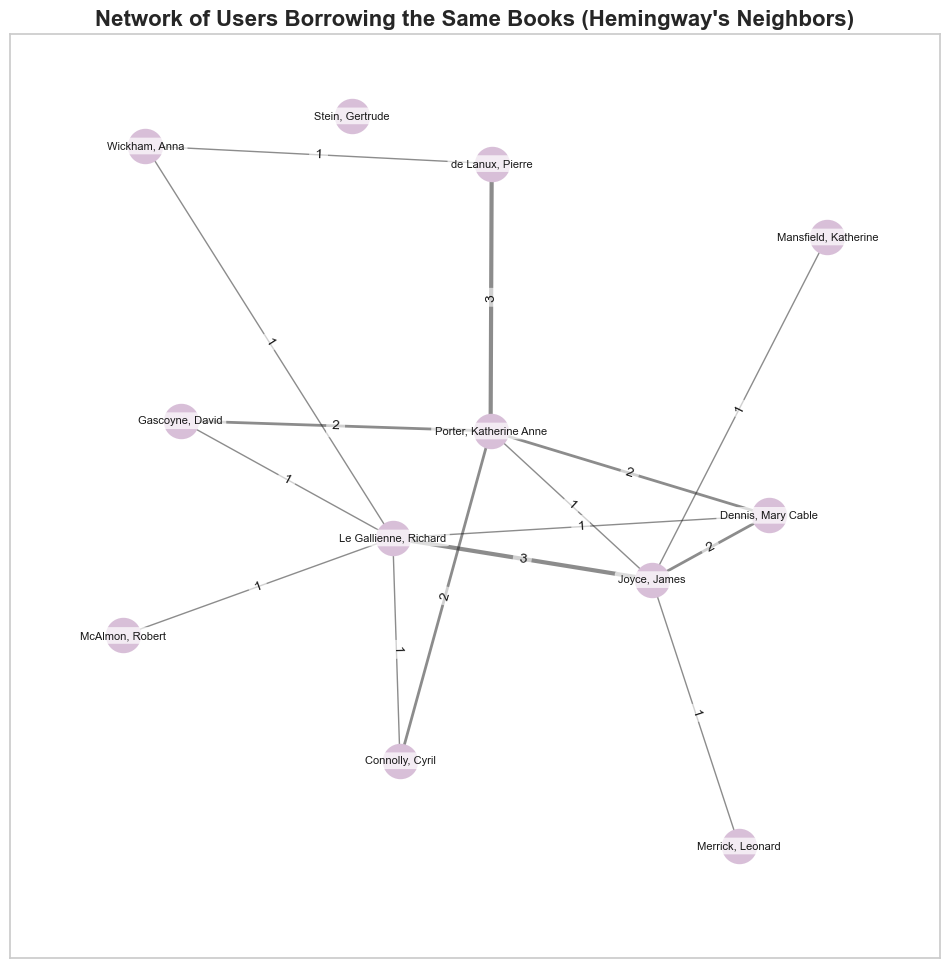

In [77]:
hemingway_neighbors_g = create_subgraph(G, 'Hemingway, Ernest')

plot_network(hemingway_neighbors_g, use_weight=True, k=1.4, titleAdd="(Hemingway's Neighbors)", label_weights=True)

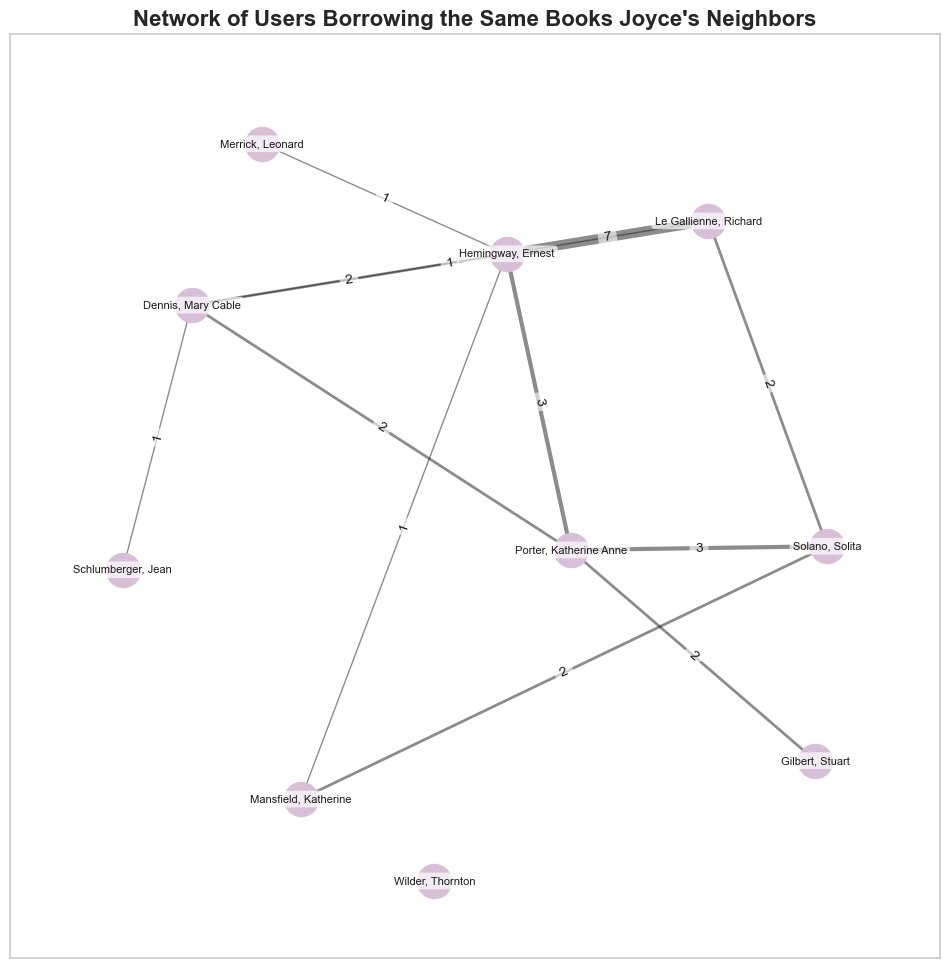

In [78]:
joyce_neighbors_g = create_subgraph(G, 'Joyce, James')

plot_network(joyce_neighbors_g, use_weight=True, k=2.5, titleAdd="Joyce's Neighbors", label_weights=True)

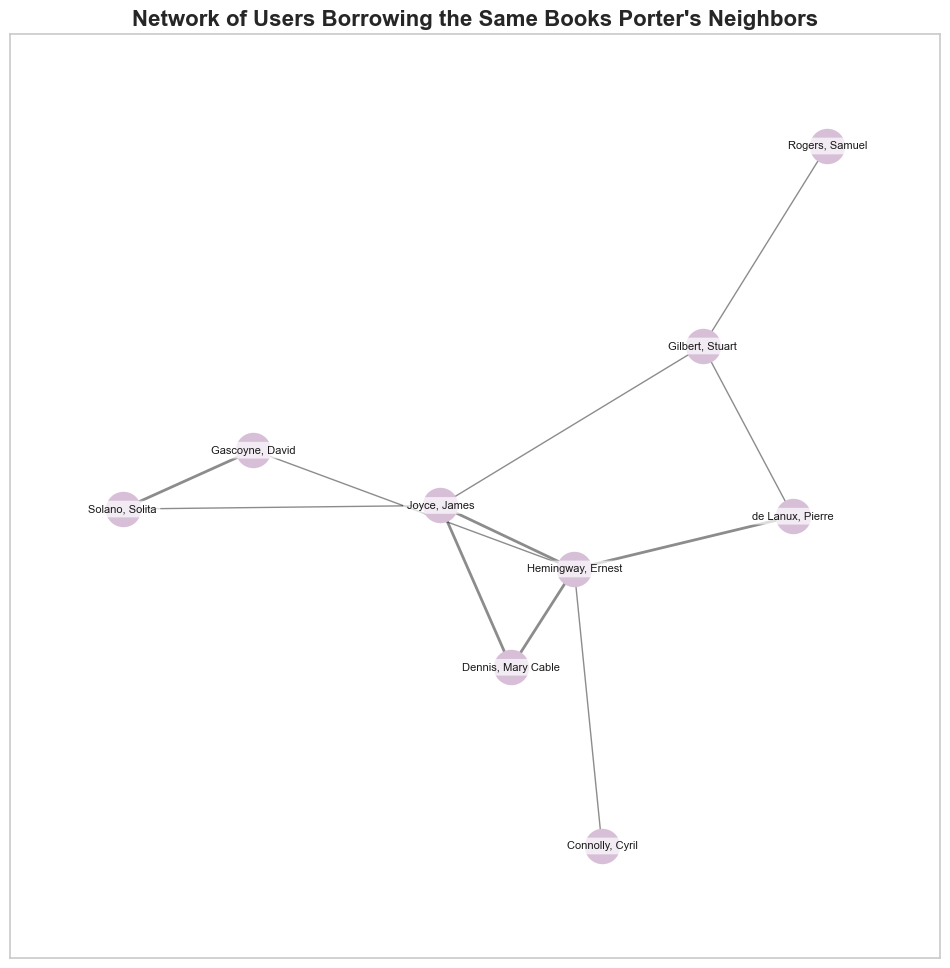

In [79]:
porter_neighbors_g = create_subgraph(G, 'Porter, Katherine Anne')

plot_network(porter_neighbors_g, k=1, titleAdd="Porter's Neighbors")

#### Clustering Coefficient

Average clustering coefficient of network is about 0.41, which is relatively high. This suggests that the network is highly clustered, with many nodes forming tightly knit groups. This is a common property of social networks, where individuals tend to form groups with shared interests or characteristics.

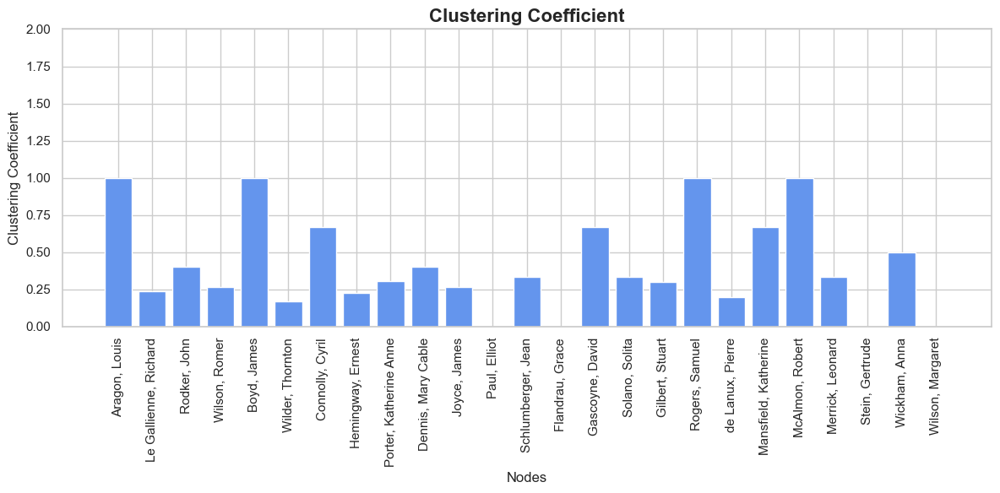

In [80]:
# Clustering coefficient
cluster_coefficient_g = nx.clustering(G)  # Replace G with your graph
plot_graph_metric(cluster_coefficient_g, x_label="Nodes", y_label="Clustering Coefficient", title="Clustering Coefficient")

In [81]:
cluster_coefficient_g

{'Aragon, Louis': 1.0,
 'Le Gallienne, Richard': 0.23636363636363636,
 'Rodker, John': 0.4,
 'Wilson, Romer': 0.26666666666666666,
 'Boyd, James': 1.0,
 'Wilder, Thornton': 0.16666666666666666,
 'Connolly, Cyril': 0.6666666666666666,
 'Hemingway, Ernest': 0.22727272727272727,
 'Porter, Katherine Anne': 0.3055555555555556,
 'Dennis, Mary Cable': 0.4,
 'Joyce, James': 0.26666666666666666,
 'Paul, Elliot': 0,
 'Schlumberger, Jean': 0.3333333333333333,
 'Flandrau, Grace': 0,
 'Gascoyne, David': 0.6666666666666666,
 'Solano, Solita': 0.3333333333333333,
 'Gilbert, Stuart': 0.3,
 'Rogers, Samuel': 1.0,
 'de Lanux, Pierre': 0.2,
 'Mansfield, Katherine': 0.6666666666666666,
 'McAlmon, Robert': 1.0,
 'Merrick, Leonard': 0.3333333333333333,
 'Stein, Gertrude': 0,
 'Wickham, Anna': 0.5,
 'Wilson, Margaret': 0}

#### Nodes, Edges, Diameter, Density, Average Shortest Path Length

In [82]:
# number of nodes
# number of members
nodes_g = len(G.nodes())
nodes_g

25

In [83]:
# number of edges
# number of relationships
edges_g = len(G.edges())
edges_g

58

The density of a graph is a measure of how many ties between actors exist compared to how many ties between actors are possible.

In [84]:
# density
density_g = nx.density(G)
density_g

0.19333333333333333

How many possible edges in the network are present? About 19% --> Relatively diverse reading habits

In [85]:
# diameter
diameter_g = nx.diameter(G)
diameter_g

4

The average shortest path length is calculated by finding the shortest path between all pairs of nodes, and taking the average over all paths of the length thereof (the length being the number of intermediate edges contained in the path).

Even in the relatively sparse network, members are not too distant from each other, meaning the library community is fairly interconnected.

In [86]:
# average shortest path length
average_shortest_path_g = nx.average_shortest_path_length(G)
average_shortest_path_g

2.1733333333333333

Any two nodes in the network can be connected by a little over two steps

#### Assortativity and Average Clustering Coefficient

The assortativity coefficient is the Pearson correlation coefficient of degree between pairs of linked nodes. Positive values of r indicate a correlation between nodes of similar degree, while negative values indicate relationships between nodes of different degree. In general, r lies between −1 and 1. When r = 1, the network is said to have perfect assortative mixing patterns, when r = 0 the network is non-assortative, while at r = −1 the network is completely disassortative.

In [87]:
# assortativity
assortativity_g = nx.assortativity.degree_assortativity_coefficient(G)
assortativity_g

-0.22988687187582266

The assortativity coefficient of a graph is a measure of the extent to which vertices with the same properties connect to each other.

In [88]:
# average clustering coefficient
average_clustering_g = nx.average_clustering(G)
average_clustering_g

0.4107676767676767

#### Small World

In [89]:
# small worldness is defined as the ratio between average clustering coefficient and average shortest path length,
# relative to an equivalent random graph
small_world_g = average_clustering_g/average_shortest_path_g
small_world_g

0.18900353225506597

In [90]:
small_world_sigma_g = nx.algorithms.smallworld.sigma(G,niter=10,nrand=5)
small_world_sigma_g

1.088216627882378

A sigma value greater than 1 indicates that the network exhibits small-world properties. The given network has higher clustering than a random network but similar path lengths, characteristic of small-world networks.

#### Cliques

All nodes in a clique are connected with each other.

Interesting are “maximal cliques”

In [91]:
clique_g = list(nx.clique.find_cliques(G))

In [92]:
len(clique_g)

34

In [93]:
clique_g

[['Hemingway, Ernest', 'de Lanux, Pierre', 'Porter, Katherine Anne'],
 ['Hemingway, Ernest', 'de Lanux, Pierre', 'Wickham, Anna'],
 ['Hemingway, Ernest', 'Mansfield, Katherine', 'Joyce, James'],
 ['Hemingway, Ernest',
  'Le Gallienne, Richard',
  'Joyce, James',
  'Dennis, Mary Cable'],
 ['Hemingway, Ernest', 'Le Gallienne, Richard', 'Gascoyne, David'],
 ['Hemingway, Ernest', 'Le Gallienne, Richard', 'Wickham, Anna'],
 ['Hemingway, Ernest', 'Le Gallienne, Richard', 'Connolly, Cyril'],
 ['Hemingway, Ernest', 'Le Gallienne, Richard', 'McAlmon, Robert'],
 ['Hemingway, Ernest', 'Stein, Gertrude'],
 ['Hemingway, Ernest', 'Merrick, Leonard', 'Joyce, James'],
 ['Hemingway, Ernest', 'Porter, Katherine Anne', 'Connolly, Cyril'],
 ['Hemingway, Ernest', 'Porter, Katherine Anne', 'Gascoyne, David'],
 ['Hemingway, Ernest',
  'Porter, Katherine Anne',
  'Joyce, James',
  'Dennis, Mary Cable'],
 ['Paul, Elliot', 'Dennis, Mary Cable'],
 ['Boyd, James', 'Wilson, Romer', 'Wilder, Thornton'],
 ['Solano, 

#### Communities

“there are more links within a community than to nodes
outside of it”

label_propagation_communities generates community sets determined by label propagation

##### Label propagation

In [94]:
def get_node_colors_by_clustering(graph, clustering_algorithm):
    """
    Applies a clustering algorithm to the graph and returns node colors.

    Parameters:
    - graph (networkx.Graph): The input graph.
    - clustering_algorithm (function): The clustering algorithm to apply. 
      It should return a list of sets, where each set contains the nodes in a cluster.

    Returns:
    - list: A list of colors (one per node) representing cluster membership.
    """
    communities = list(clustering_algorithm(graph))  # Apply the clustering algorithm
    community_map = {node: idx for idx, community in enumerate(communities) for node in community}
    return [community_map[node] for node in graph.nodes()]

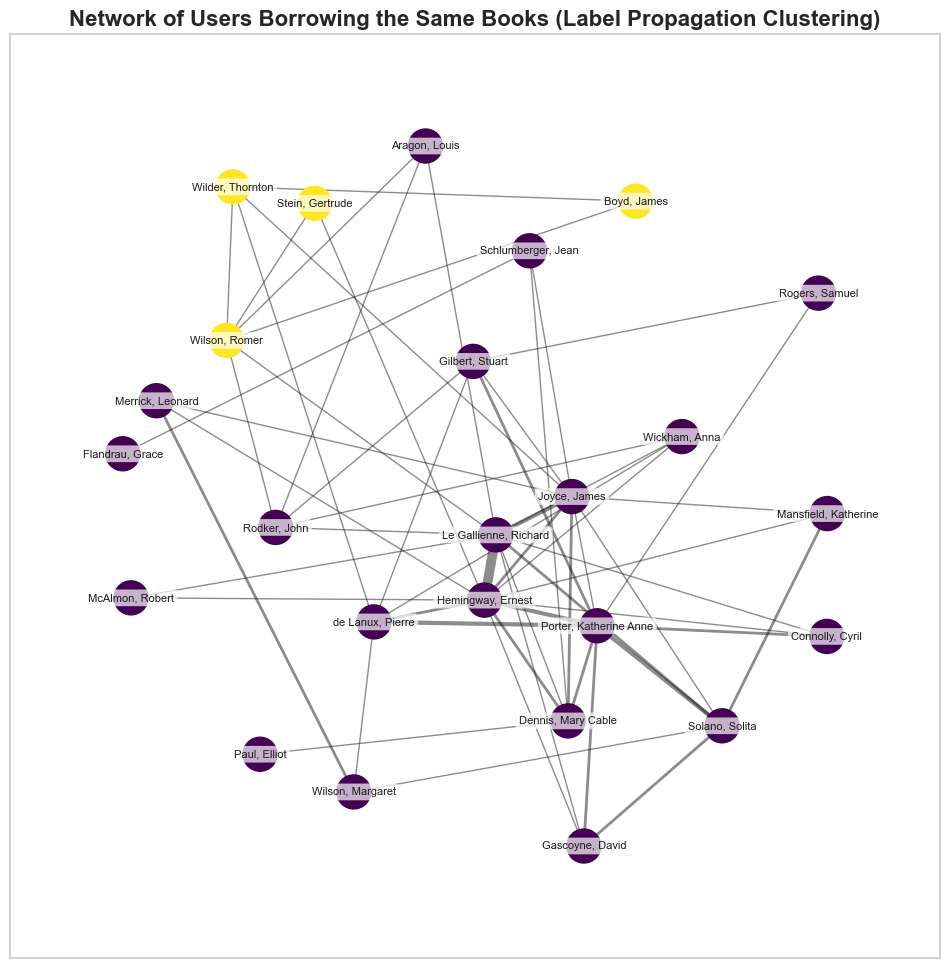

In [95]:
# Clustering with Label Propagation
label_propagation_colors_g = get_node_colors_by_clustering(G, nx.community.label_propagation_communities)

# Plot with Label Propagation
plot_network(G, use_weight=True, titleAdd='(Label Propagation Clustering)', k=1.7,node_color=label_propagation_colors_g)

##### Louvain

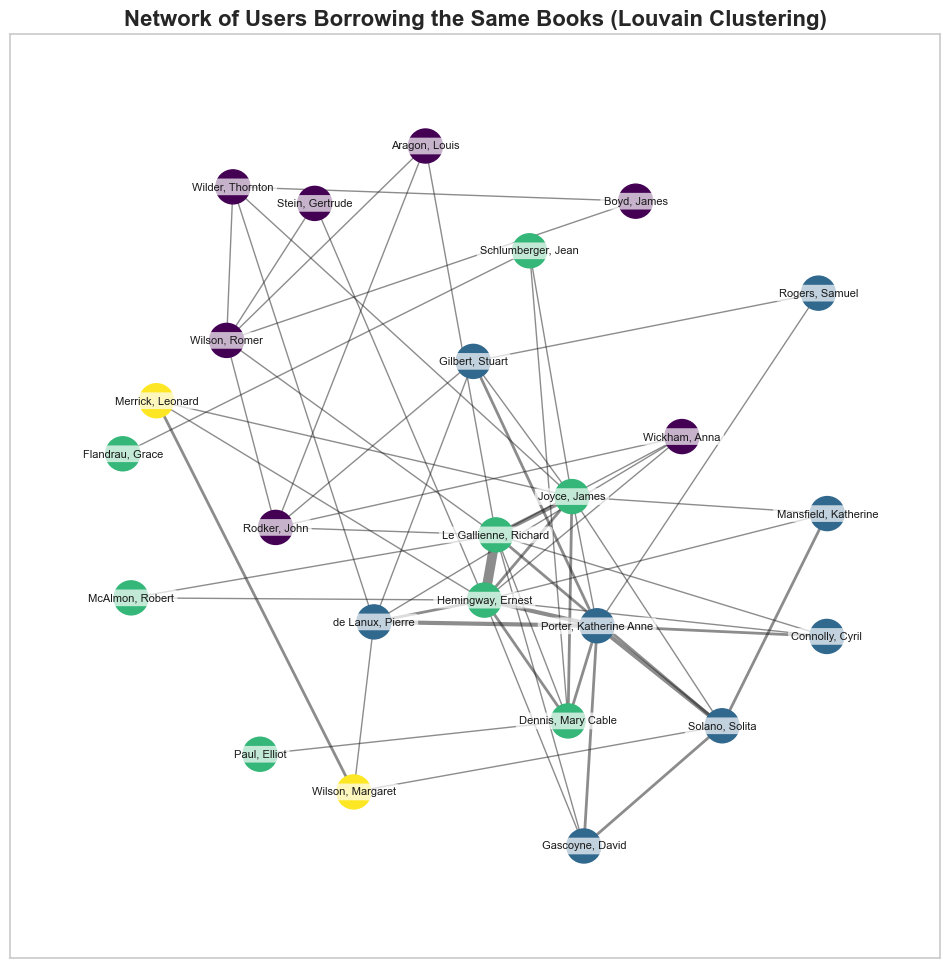

In [96]:
# Clustering with Louvain
louvain_colors_g = get_node_colors_by_clustering(G, nx.community.louvain_communities)

# Plot with Louvain
plot_network(G, titleAdd='(Louvain Clustering)', k=1.7,node_color=louvain_colors_g)

##### Greedy Modularity

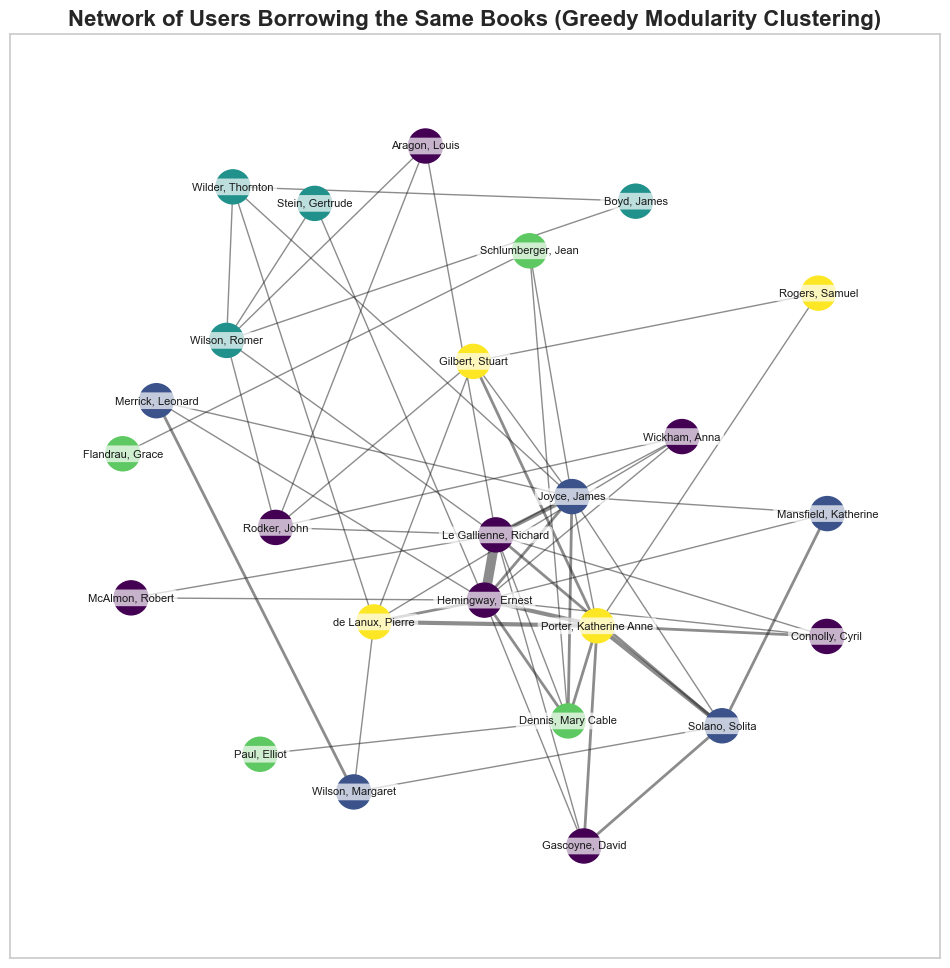

In [97]:
# Clustering with Greedy Modularity
greedy_modularity_colors_g = get_node_colors_by_clustering(G, nx.community.greedy_modularity_communities)

# Plot with Greedy Modularity
plot_network(G, titleAdd='(Greedy Modularity Clustering)', k=1.7,node_color=greedy_modularity_colors_g)

#### Network Graph: Books and Author-Members

In [98]:
def create_edge_list(pivot_table, min_borrow_count=1):
    """
    Converts a pivot table to an edge list and filters out books borrowed less than a specified number of times.

    Parameters:
    pivot_table (pd.DataFrame): A pivot table with members and items.
    min_borrow_count (int): Minimum number of times a book should be borrowed to be included. Default is 1.

    Returns:
    pd.DataFrame: Filtered edge list.
    """
    edge_list = pivot_table.stack().reset_index()
    edge_list.columns = ['member_sort_names', 'item_title', 'borrowed']
    edge_list = edge_list[edge_list['borrowed'] > 0]
    
    # Filter books borrowed more than `min_borrow_count` times
    book_counts = edge_list['item_title'].value_counts()
    books_multi_borrowed = book_counts[book_counts > min_borrow_count].index
    edge_list = edge_list[edge_list['item_title'].isin(books_multi_borrowed)]
    
    return edge_list

def build_graph(edge_list):
    """
    Builds a graph from an edge list.

    Parameters:
    edge_list (pd.DataFrame): DataFrame containing source and target nodes.

    Returns:
    networkx.Graph: Generated graph.
    """
    return nx.from_pandas_edgelist(edge_list, source='item_title', target='member_sort_names', create_using=nx.Graph())

def assign_node_colors(graph, item_nodes, item_color='lightsteelblue', member_color='darkorange'):
    """
    Assigns colors to nodes based on their type (item or member).

    Parameters:
    graph (networkx.Graph): The graph containing nodes.
    item_nodes (set): A set of item nodes to be colored.
    item_color (str): Color for item nodes. Default is 'lightsteelblue'.
    member_color (str): Color for member nodes. Default is 'darkorange'.

    Returns:
    list: List of colors corresponding to each node in the graph.
    """
    return [item_color if node in item_nodes else member_color for node in graph]

c:\Users\dittm\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


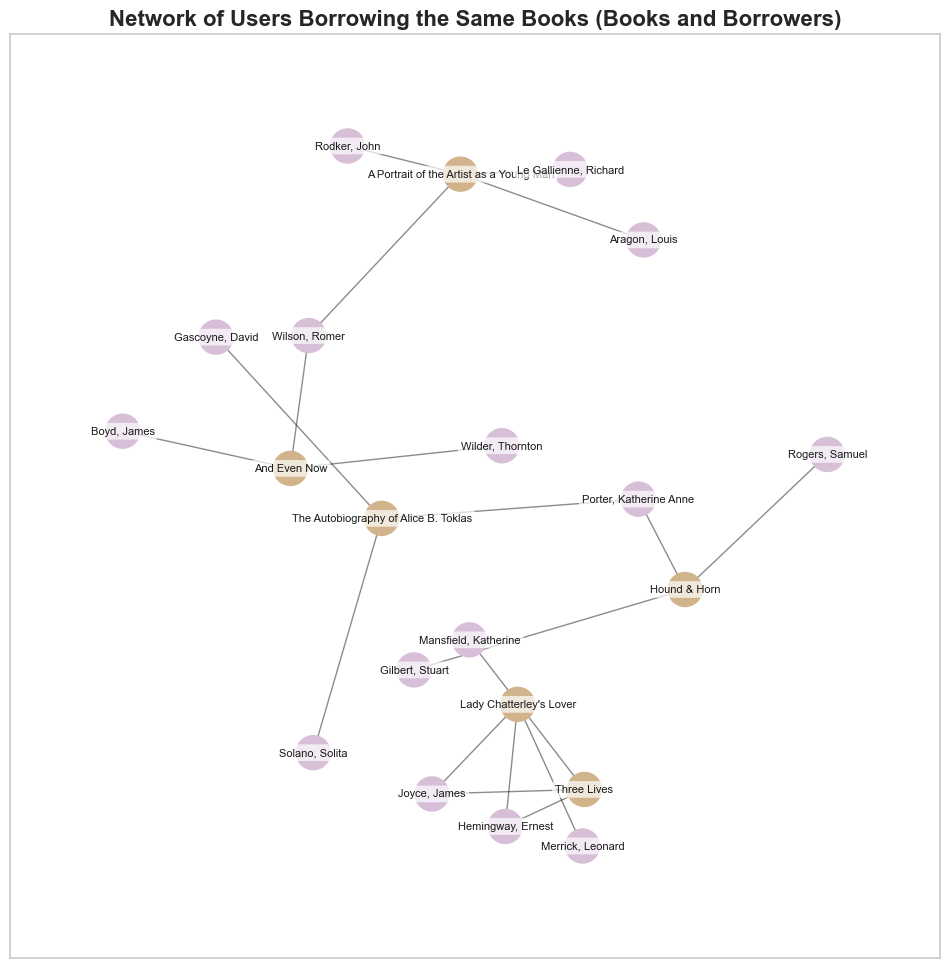

In [99]:
# Generate the edge list and graph
edge_list_g = create_edge_list(user_book_matrix, min_borrow_count=2)
G_T = build_graph(edge_list_g)

# Generate node colors
node_colors_g = assign_node_colors(
    G_T, 
    item_nodes=set(edge_list_g['item_title'].unique()), 
    item_color='tan', 
    member_color='thistle'
)

plot_network(
    G_T, 
    use_weight=False,  # Set to True if edge weights are to be used
    k=0.88,  # Adjust as necessary for optimal layout
    titleAdd='(Books and Borrowers)', 
    node_color=node_colors_g  # Pass the computed node colors
)

In [100]:
# Add color attributes to nodes
for node, color in zip(G_T.nodes(), node_colors_g):
    rgb = mcolors.to_rgb(color)
    G_T.nodes[node]['viz'] = {'color': {'r': int(rgb[0] * 255), 'g': int(rgb[1] * 255), 'b': int(rgb[2] * 255), 'a': 0}}

# Export the graph to GEXF
nx.write_gexf(G_T, 'test2.gexf')

--------

### Common Borrows by Author-Members (Only Books by Author-Members)

In [101]:
member_borrows_member = member_borrows_author[member_borrows_author.item_authors.isin(member_is_author.sort_name)]

member_borrows_member.sample(1)

,event_type,start_date,end_date,member_uris,member_names,member_sort_names,subscription_price_paid,subscription_deposit,subscription_duration,subscription_duration_days,...,item_uri,item_title,item_volume,item_authors,item_year,item_notes,source_type,source_citation,source_manifest,source_image
7628,Borrow,1927-02-07,1927-02-08,https://shakespeareandco.princeton.edu/members...,Anna Wickham,"Wickham, Anna",NaN,NaN,NaN,NaN,...,https://shakespeareandco.princeton.edu/books/j...,Ulysses,NaN,"Joyce, James",1922.0,NaN,Lending Library Card,"Sylvia Beach, Mrs Anna Wickham Lending Library...",https://figgy.princeton.edu/concern/scanned_re...,https://iiif.princeton.edu/loris/figgy_prod/00...


In [102]:
member_borrows_member_matrix = create_pivot_table(
    data=member_borrows_member, 
    index='member_sort_names', 
    columns='item_title'
)

print(member_borrows_member_matrix.sample(2))

item_title         A Companion Volume  A Farewell to Arms  A Good Woman  \
member_sort_names                                                         
Gilbert, Stuart                     0                   0             0   
Connolly, Cyril                     0                   0             0   

item_title         A Hasty Bunch  A Mirror to France  A Modern Hero  \
member_sort_names                                                     
Gilbert, Stuart                0                   0              0   
Connolly, Cyril                0                   0              0   

item_title         A Portrait of the Artist as a Young Man  \
member_sort_names                                            
Gilbert, Stuart                                          0   
Connolly, Cyril                                          0   

item_title         A. O. Barnabooth: His Diary  \
member_sort_names                                
Gilbert, Stuart                              0   
Connolly, Cyril

In [103]:
borrow_counts_member = compute_borrow_counts(member_borrows_member_matrix)

In [104]:
# Create the second graph
P = create_intersection_graph(member_borrows_member_matrix)
print("Graph P - Number of nodes:", P.number_of_nodes())
print("Graph P - Number of edges:", P.number_of_edges())

Graph P - Number of nodes: 14
Graph P - Number of edges: 18


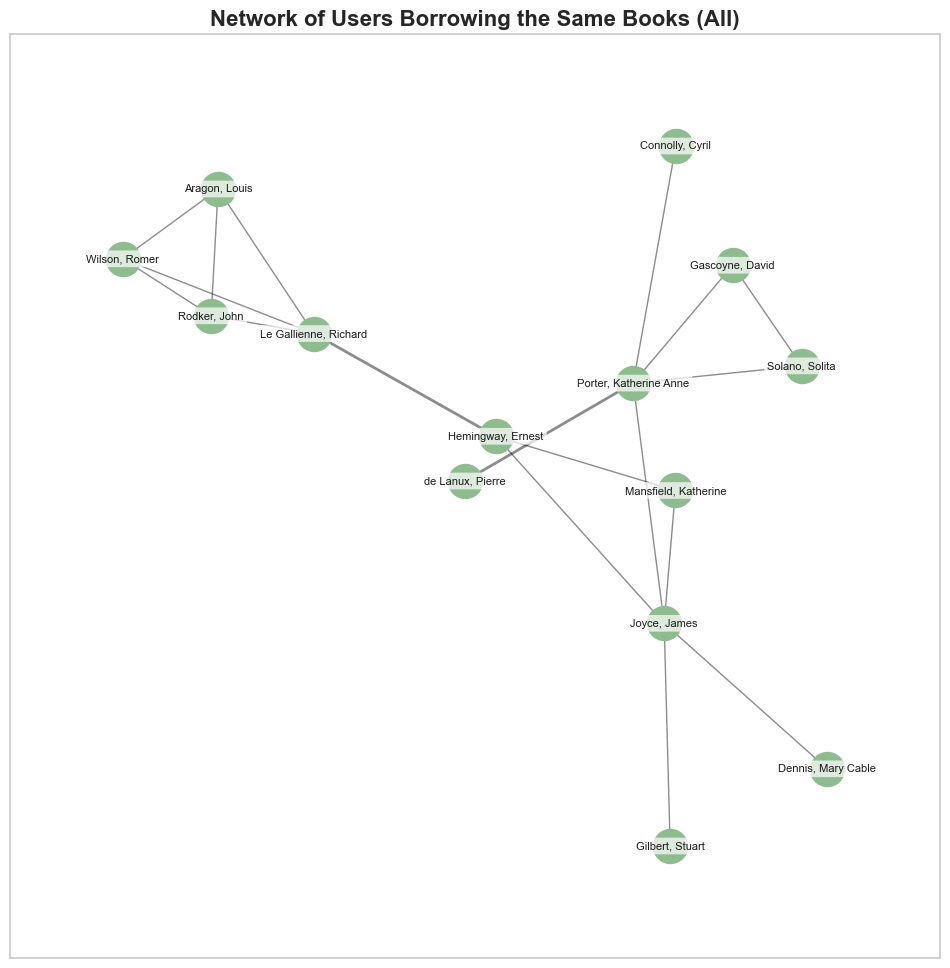

In [105]:
plot_network(P, use_weight=True, k=0.67, titleAdd='(All)', node_color='darkseagreen')

In [106]:
edge_weights_members_p = nx.get_edge_attributes(P,'weight')

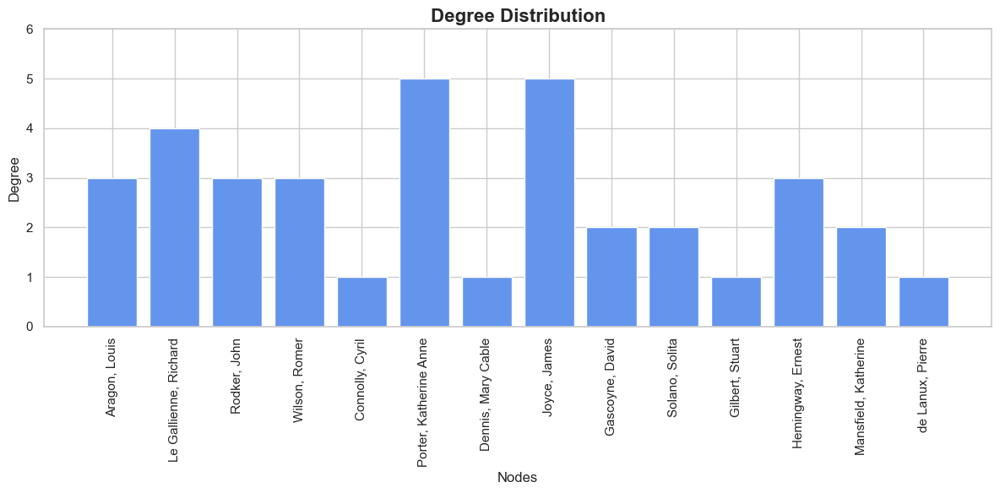

In [107]:
# Degree distribution
degree_dict_p = dict(P.degree())
plot_graph_metric(degree_dict_p, x_label="Nodes", y_label="Degree", title="Degree Distribution")

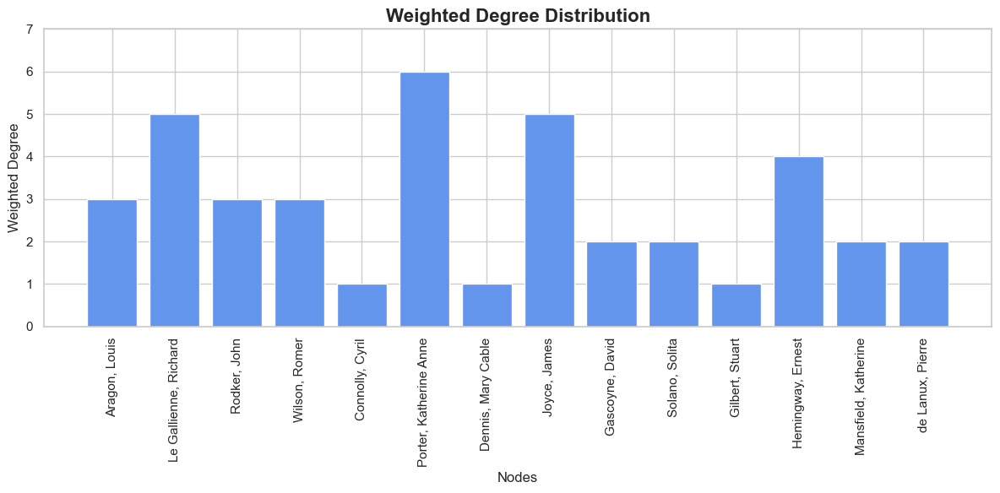

In [108]:
# Weighted degree distribution
weighted_degree_dict_p = dict(P.degree(weight="weight"))
plot_graph_metric(weighted_degree_dict_p, x_label="Nodes", y_label="Weighted Degree", title="Weighted Degree Distribution")

##### Neighbors

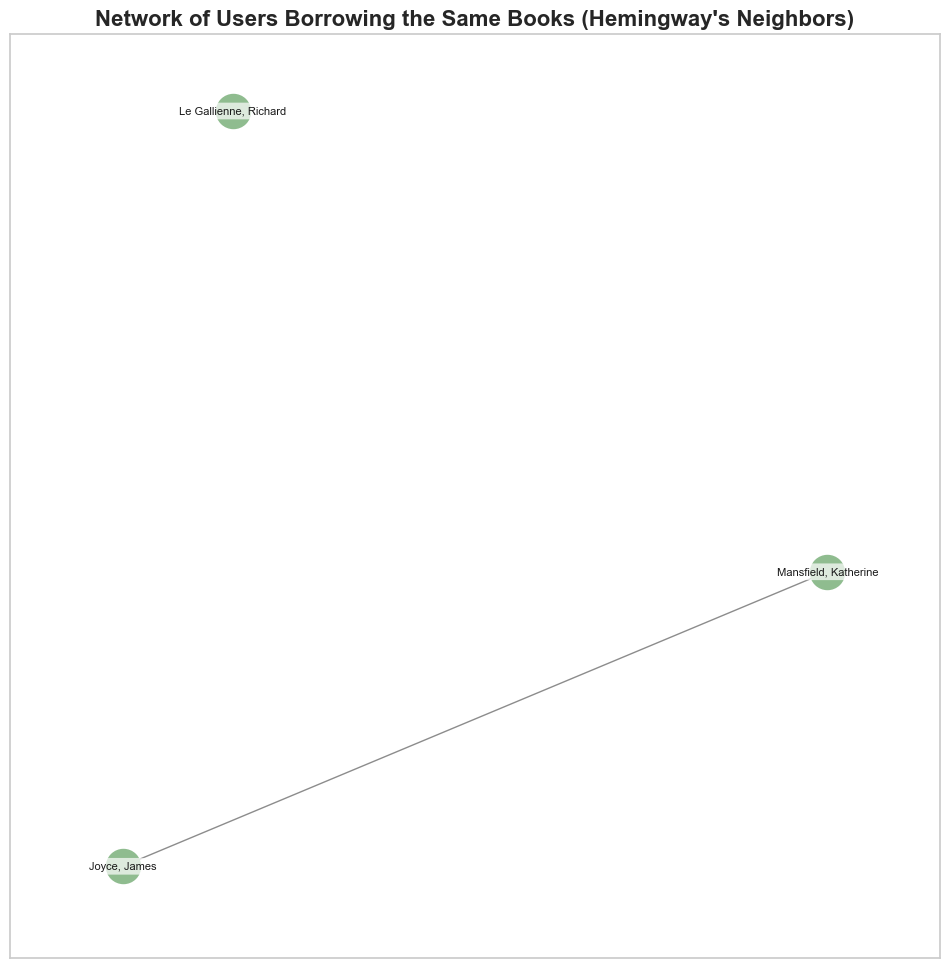

In [109]:
hemingway_neighbors_p = create_subgraph(P, 'Hemingway, Ernest')

plot_network(hemingway_neighbors_p, use_weight=True, k=5, titleAdd="(Hemingway's Neighbors)", node_color='darkseagreen')

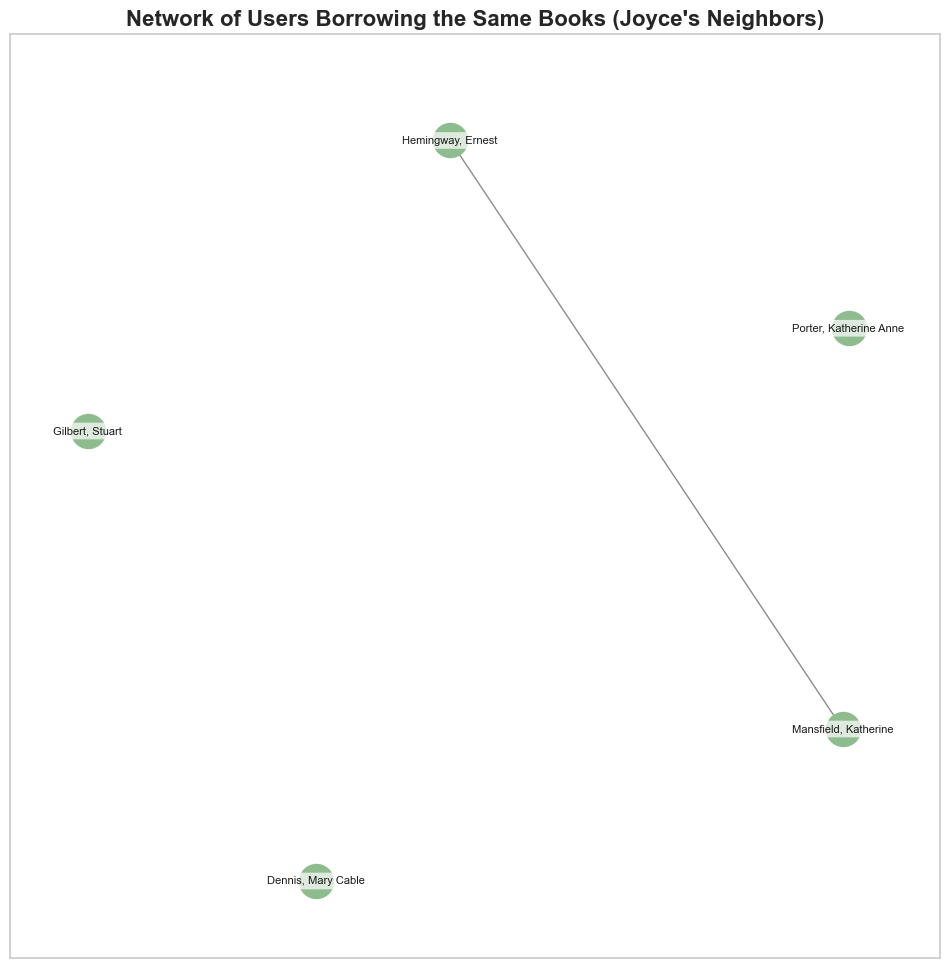

In [110]:
joyce_neighbors_p = create_subgraph(P, 'Joyce, James')

plot_network(joyce_neighbors_p, use_weight=True, k=5, titleAdd="(Joyce's Neighbors)", node_color='darkseagreen')

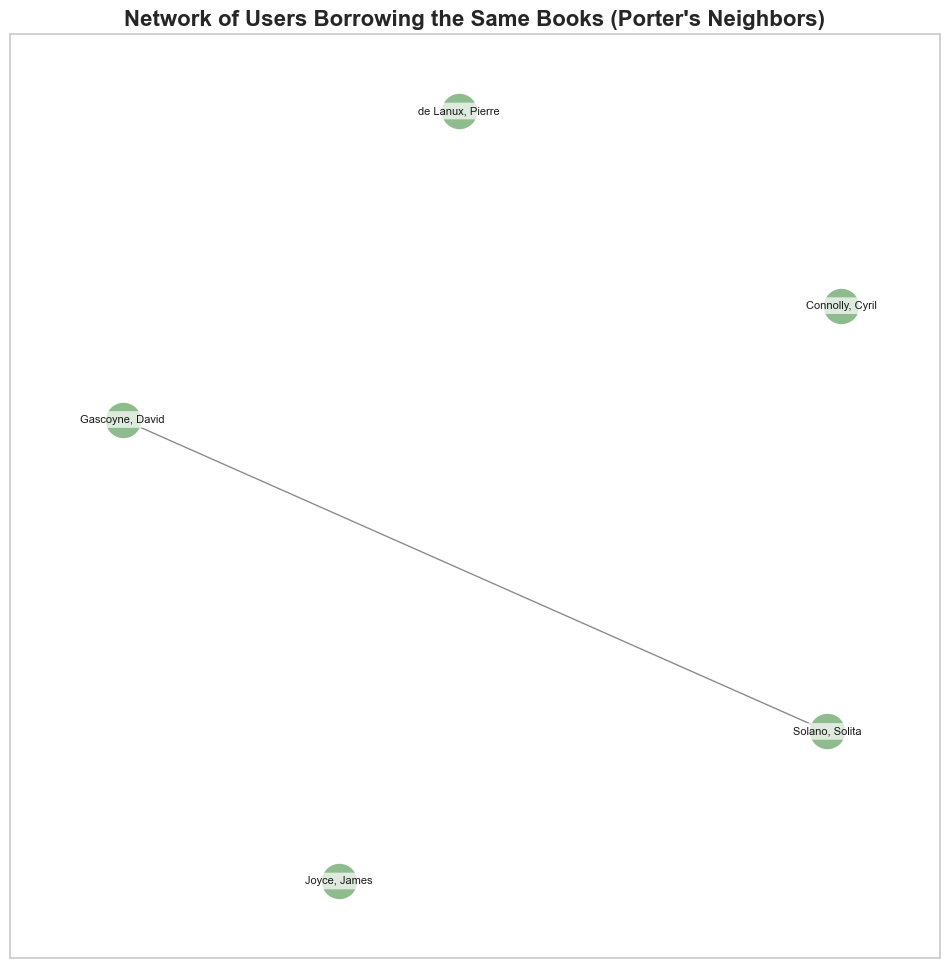

In [111]:
porter_neighbors_p = create_subgraph(P, 'Porter, Katherine Anne')

plot_network(porter_neighbors_p, use_weight=True, k=5, titleAdd="(Porter's Neighbors)", node_color='darkseagreen')

#### Clustering Coefficient

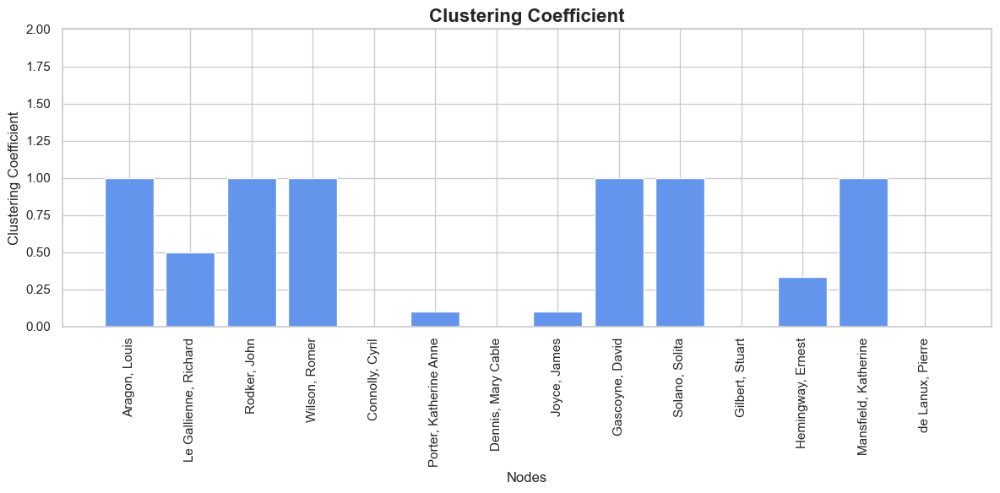

In [112]:
# Clustering coefficient
cluster_coefficient_p = nx.clustering(P)  # Replace G with your graph
plot_graph_metric(cluster_coefficient_p, x_label="Nodes", y_label="Clustering Coefficient", title="Clustering Coefficient")

#### Nodes, Edges, Diameter, Density, Average Shortest Path Length

In [113]:
# number of nodes
# number of members
nodes_p = len(P.nodes())
nodes_p

14

In [114]:
# number of edges
# number of relationships
edges_p = len(P.edges())
edges_p

18

In [115]:
# density
density_p = nx.density(P)
density_p

0.1978021978021978

In [116]:
# diameter
diameter_p = nx.diameter(P)
diameter_p

5

In [117]:
# average shortest path length
average_shortest_path_p = nx.average_shortest_path_length(P)
average_shortest_path_p

2.758241758241758

#### Assortativity and Average Clustering Coefficient

In [118]:
# assortativity
assortativity_p = nx.assortativity.degree_assortativity_coefficient(P)
assortativity_p

-0.5817223198594034

In [119]:
# average clustering coefficient
average_clustering_p = nx.average_clustering(P)
average_clustering_p

0.5023809523809524

#### Small World

In [120]:
# small worldness is defined as the ratio between average clustering coefficient and average shortest path length,
# relative to an equivalent random graph
small_world_g = nx.average_clustering(G)/nx.average_shortest_path_length(G)
small_world_g

0.18900353225506597

In [121]:
small_world_sigma_g = nx.algorithms.smallworld.sigma(G,niter=10,nrand=5)
small_world_sigma_g

1.1626448534423994

#### Cliques

In [122]:
clique_g = list(nx.clique.find_cliques(G))

In [123]:
len(clique_g)

34

In [124]:
# clique_g

#### Communities

##### Label Propagation

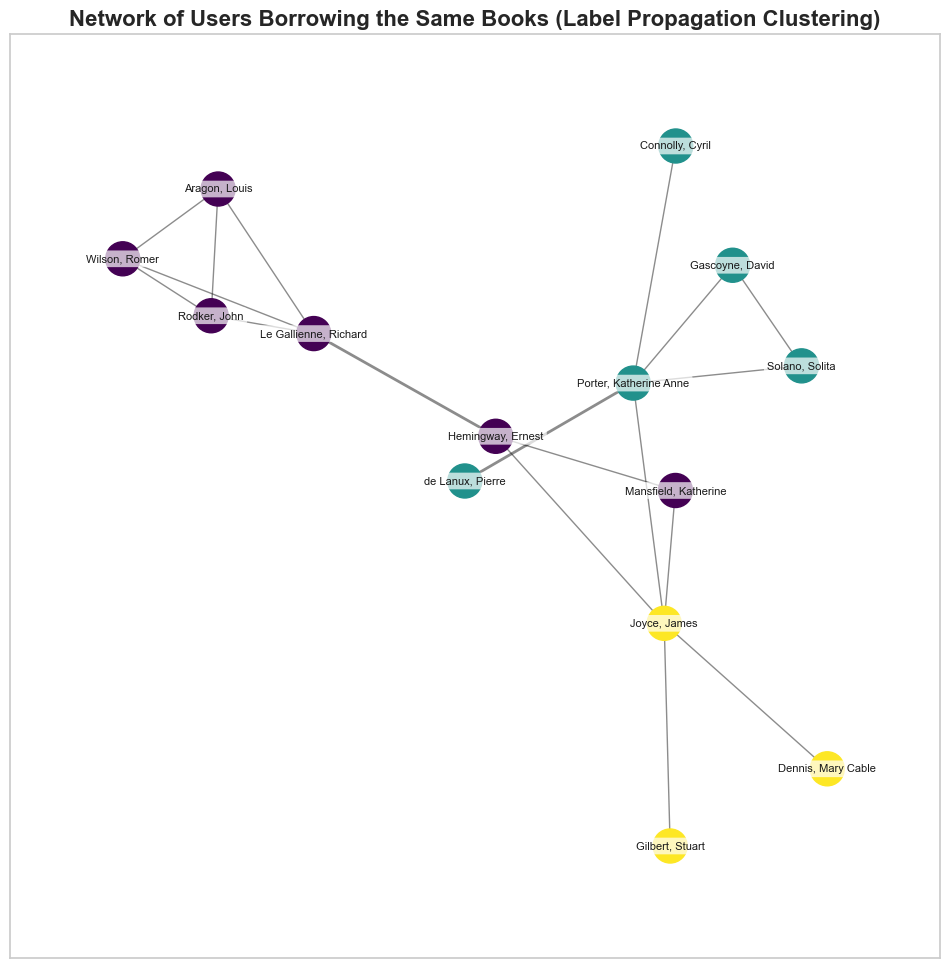

In [125]:
# Clustering with Label Propagation
label_propagation_colors_p = get_node_colors_by_clustering(P, nx.community.label_propagation_communities)

# Plot with Label Propagation
plot_network(P, use_weight=True, titleAdd='(Label Propagation Clustering)', k=0.67,node_color=label_propagation_colors_p)

##### Louvain

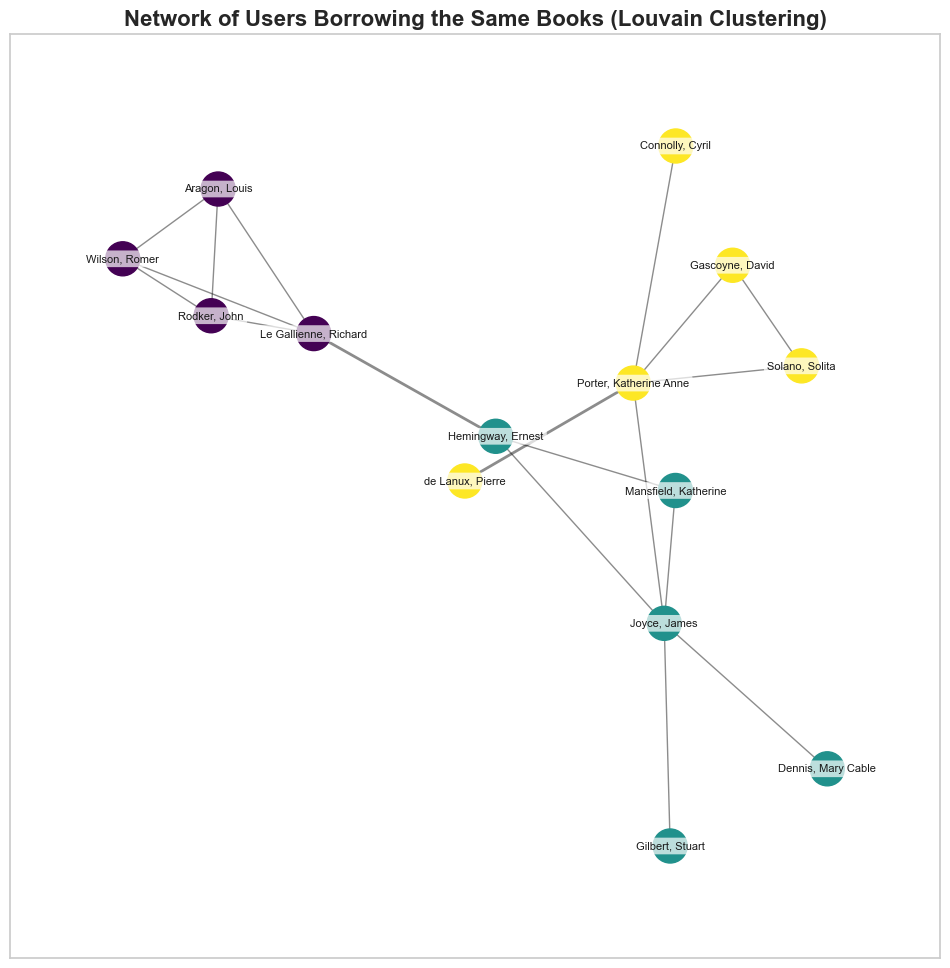

In [126]:
# Clustering with Louvain
louvain_colors_p = get_node_colors_by_clustering(P, nx.community.louvain_communities)

# Plot with Louvain
plot_network(P, use_weight=True, titleAdd='(Louvain Clustering)', k=0.67,node_color=louvain_colors_p)

##### Greedy Modularity

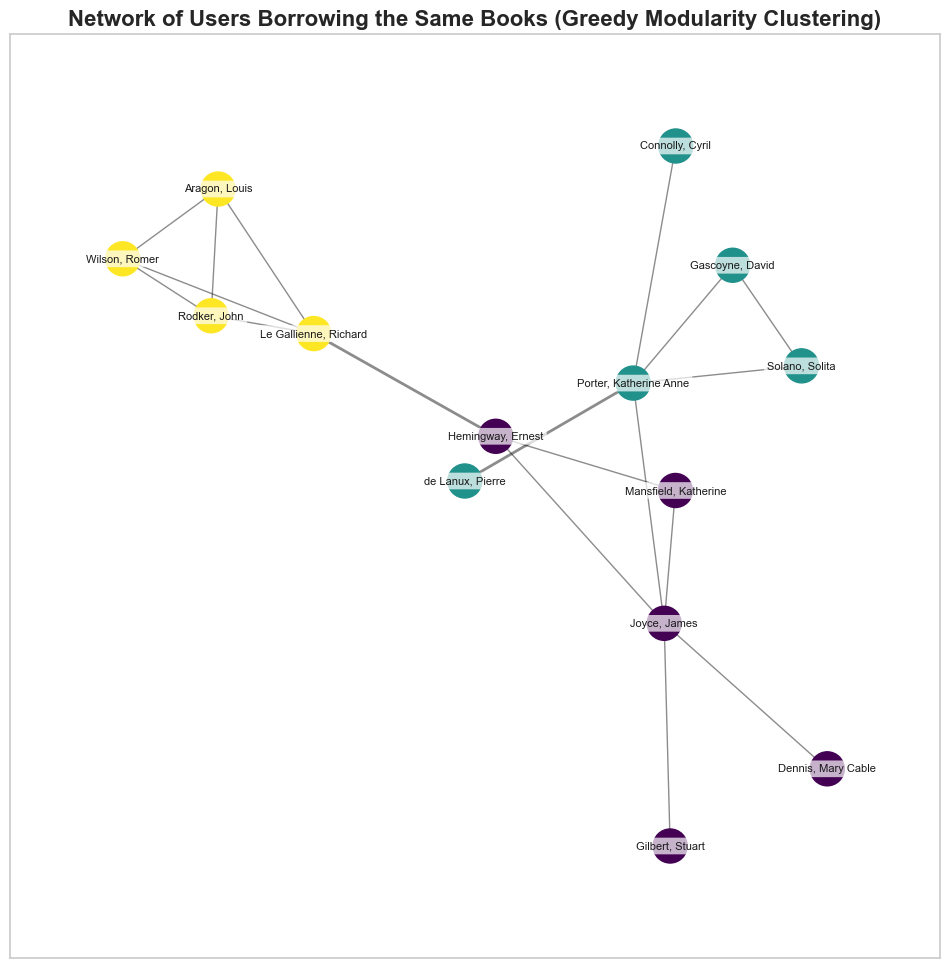

In [127]:
# Clustering with Greedy Modularity
greedy_modularity_colors_p = get_node_colors_by_clustering(P, nx.community.greedy_modularity_communities)

# Plot with Greedy Modularity
plot_network(P, use_weight=True, titleAdd='(Greedy Modularity Clustering)', k=0.67,node_color=greedy_modularity_colors_p)

In [128]:
compute_borrow_counts(member_borrows_member_matrix, top_n=14)

,book_title,author,borrow_count
6,A Portrait of the Artist as a Young Man,"Joyce, James",4
0,A Companion Volume,"McAlmon, Robert",3
35,The Autobiography of Alice B. Toklas,"Stein, Gertrude",3
47,Three Lives,"Stein, Gertrude",3
4,A Mirror to France,"Ford, Ford Madox",2
49,To Return to Yesterday: Reminiscences 1894 – 1914,"Ford, Ford Madox",2
8,Back to Montparnasse: Glimpses of Broadway in ...,"Huddleston, Sisley",2
28,Oscar Wilde: His Life and Confessions,"Harris, Frank",2
11,Death in the Afternoon,"Hemingway, Ernest",2
12,Distinguished Air: Grim Fairy Tales,"McAlmon, Robert",2


In [129]:
# extract the members that borrowed "Saturdy Review of Literature"
members_borrowed_sat_lit = user_book_matrix[user_book_matrix["This Side of Paradise"] > 0].index
members_borrowed_sat_lit

Index(['Stein, Gertrude'], dtype='object', name='member_sort_names')

In [130]:
# extract the members that borrowed "Saturdy Review of Literature"
members_borrowed_sat_lit = user_book_matrix[user_book_matrix["The Counterfeiters"] > 0].index
members_borrowed_sat_lit

Index(['Le Gallienne, Richard'], dtype='object', name='member_sort_names')

In [131]:
# extract the members that borrowed "Saturdy Review of Literature"
members_borrowed_sat_lit = user_book_matrix[user_book_matrix["Geography and Plays"] > 0].index
members_borrowed_sat_lit

Index(['Gascoyne, David'], dtype='object', name='member_sort_names')

#### Network Graph: Books and Author-Members

c:\Users\dittm\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


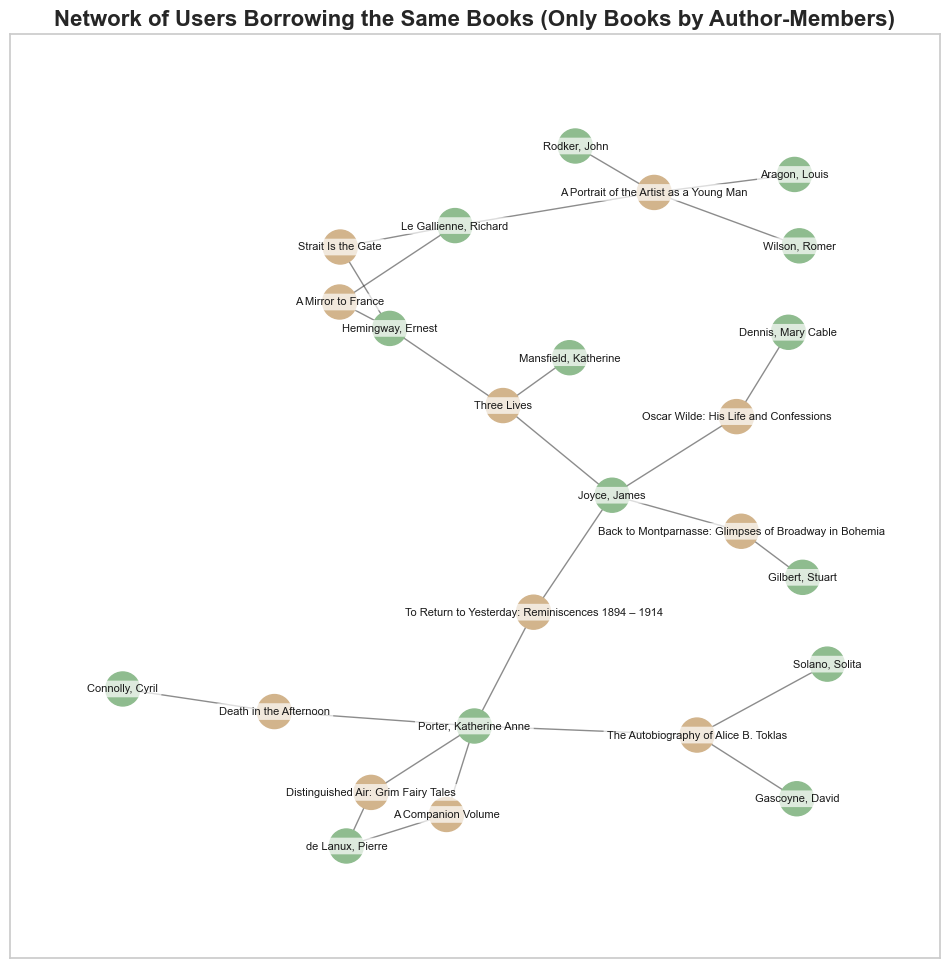

In [132]:
# Generate the edge list and graph
edge_list = create_edge_list(member_borrows_member_matrix, min_borrow_count=1)
L_M = build_graph(edge_list)

# Generate node colors
node_colors = assign_node_colors(
    L_M, 
    item_nodes=set(edge_list['item_title'].unique()), 
    item_color='tan', 
    member_color='darkseagreen'
)

plot_network(
    L_M, 
    use_weight=True,  # Set to True if edge weights are to be used
    k=0.3334,  # Adjust as necessary for optimal layout
    titleAdd='(Only Books by Author-Members)', 
    node_color=node_colors  # Pass the computed node colors
)

c:\Users\dittm\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:433: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


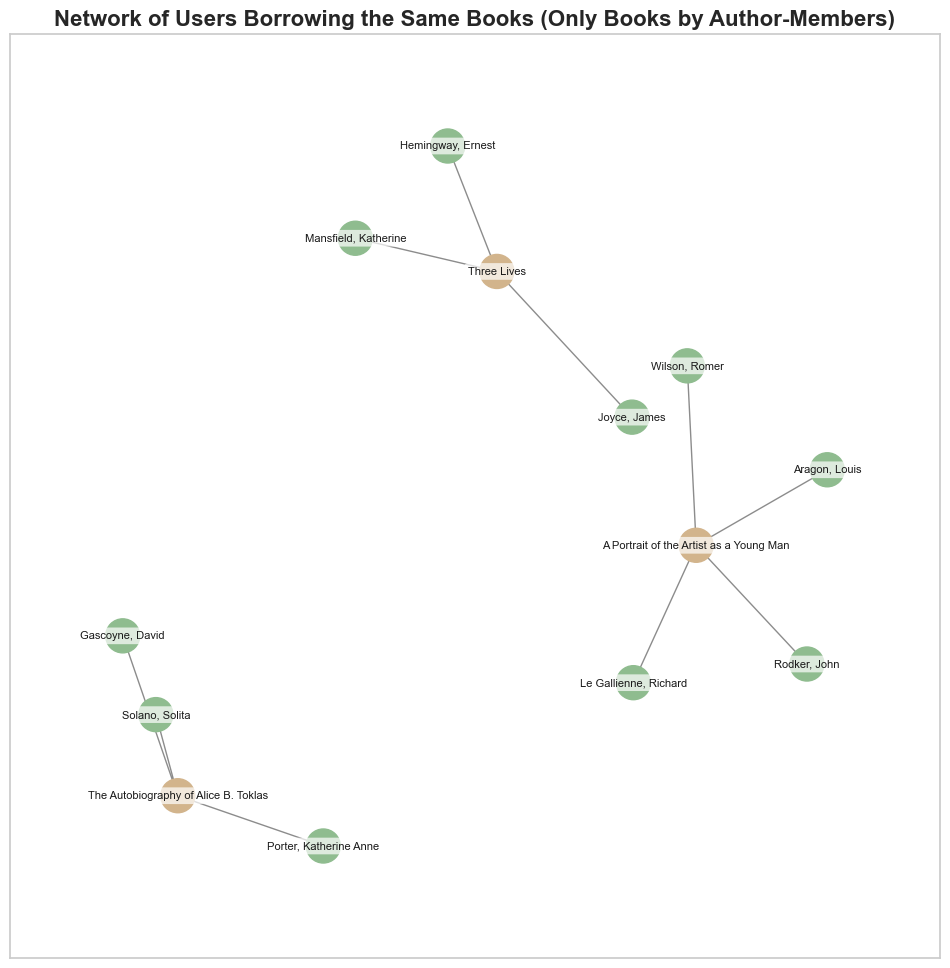

In [133]:
# Generate the edge list and graph
edge_list = create_edge_list(member_borrows_member_matrix, min_borrow_count=2)
L_M = build_graph(edge_list)

# Generate node colors
node_colors = assign_node_colors(
    L_M, 
    item_nodes=set(edge_list['item_title'].unique()), 
    item_color='tan', 
    member_color='darkseagreen'
)

plot_network(
    L_M, 
    use_weight=True,  # Set to True if edge weights are to be used
    k=0.65,  # Adjust as necessary for optimal layout
    titleAdd='(Only Books by Author-Members)', 
    node_color=node_colors  # Pass the computed node colors
)